In [1]:
# Importaciones
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import random
from geopy import distance

In [2]:
# sv: archivos con los puntos de medida
# 
# Diccionarios
dicc_IdCod = {} # Dado el ID entrega el código
dicc_IdLatLon = {} # Dado el ID entrega [latitud,longitud]
dicc_posID = {} # Dado el ID entrega la posición en las grillas
dicc_ID_mI = {} # Diccionario con la cantidad de muestras de <intensidad> por sensor

# Listas
lista_Ids = [] # IDs de los sensores en el mes de enero (fuente de datos que cumple con el 5% máximo de pérdida)
lista_Fechas = [] # Fechas que hay con muestras en el archivo de datos.


In [3]:
sv = pd.read_csv('pmed_2024/pmed_ubicacion_01-2024.csv', sep=';', quotechar='"')
pmed_encabezados = ["tipo_elem","distrito","id","cod_cent","nombre","utm_x","utm_y","longitud","latitud"]


In [4]:
sufijo_archivos_datos = ["01-2024.csv", "02-2024.csv", "03-2024.csv", "04-2024.csv", "05-2024.csv", "06-2024.csv", "07-2024.csv", "08-2024.csv", "09-2024.csv", "10-2024.csv", "11-2024.csv", "12-2024.csv"]
sensorXmes = []
for sad in sufijo_archivos_datos:
    archivo = 'pmed_2024/pmed_ubicacion_' + sad
    df = pd.read_csv(archivo, sep=';', quotechar='"', encoding='latin-1')
    print(archivo, df.shape)
    filas = df.shape[0]
    conteosensores = 0
    for v in range(filas):
        data_id = df["id"][v]
        data_cod = df["cod_cent"][v]
        data_latlon = [df["longitud"][v],df["latitud"][v]]
        if data_cod[:2] == "PM":
            if data_id not in dicc_IdCod:
                dicc_IdCod[data_id] = data_cod
                dicc_IdLatLon[data_id] = [data_latlon]
                conteosensores += 1
                pr = sad + "\t" + str(data_id) + "\t" + str(data_cod) + "\t" + str(data_latlon[0])[:10] + "\t" + str(data_latlon[1])[:10] + "\t" + str(type(data_latlon[0]))
                print(pr)
    sensorXmes.append(conteosensores)

pmed_2024/pmed_ubicacion_01-2024.csv (4910, 9)
01-2024.csv	6640	PM10013	-3.6741153	40.4810095	<class 'numpy.float64'>
01-2024.csv	6641	PM10021	-3.6740765	40.4806959	<class 'numpy.float64'>
01-2024.csv	6642	PM10091	-3.6743945	40.4760379	<class 'numpy.float64'>
01-2024.csv	6643	PM10092	-3.6745793	40.4759797	<class 'numpy.float64'>
01-2024.csv	6644	PM10141	-3.6717572	40.4708744	<class 'numpy.float64'>
01-2024.csv	6645	PM10142	-3.6718426	40.4708340	<class 'numpy.float64'>
01-2024.csv	6646	PM10211	-3.6684298	40.4664557	<class 'numpy.float64'>
01-2024.csv	6647	PM10212	-3.6686381	40.4664143	<class 'numpy.float64'>
01-2024.csv	6648	PM10241	-3.6667503	40.4633612	<class 'numpy.float64'>
01-2024.csv	6649	PM10242	-3.6669821	40.4633238	<class 'numpy.float64'>
01-2024.csv	10297	PM10293	-3.6653767	40.4601917	<class 'numpy.float64'>
01-2024.csv	6650	PM10341	-3.6634205	40.4545233	<class 'numpy.float64'>
01-2024.csv	6651	PM10342	-3.6637176	40.4544163	<class 'numpy.float64'>
01-2024.csv	6652	PM10343	-3.6

In [5]:
# Reportando cantidad de sensores que agrega cada mes
for i in range(len(sufijo_archivos_datos)):
    print(sufijo_archivos_datos[i], sensorXmes[i], "sensores agregados.")

01-2024.csv 296 sensores agregados.
02-2024.csv 0 sensores agregados.
03-2024.csv 0 sensores agregados.
04-2024.csv 0 sensores agregados.
05-2024.csv 0 sensores agregados.
06-2024.csv 0 sensores agregados.
07-2024.csv 0 sensores agregados.
08-2024.csv 0 sensores agregados.
09-2024.csv 0 sensores agregados.
10-2024.csv 0 sensores agregados.
11-2024.csv 15 sensores agregados.
12-2024.csv 10 sensores agregados.


In [6]:
# Sólo se mantienen los sensores de enero para trabajar
# Los demás meses no agregan sensores nuevos y los datos
# de noviembre y diciembre no cumplen el 5% mínimo

# Reiniciando Diccionarios
dicc_IdCod = {}
dicc_IdLatLon = {}
# Procesando los datos de ENERO
archivo = 'pmed_2024/pmed_ubicacion_01-2024.csv'
df = pd.read_csv(archivo, sep=';', quotechar='"', encoding='latin-1')
filas = df.shape[0]
for v in range(filas):
    data_id = df["id"][v]
    data_cod = df["cod_cent"][v]
    data_latlon = [df["longitud"][v],df["latitud"][v]]
    if data_cod[:2] == "PM":
        if data_id not in dicc_IdCod:
            dicc_IdCod[data_id] = data_cod
            dicc_IdLatLon[data_id] = [data_latlon]

In [7]:
# Exportando los Ids de los sensores registrados para proceso de filtrado de las fuentes de datos (C++)
lista_Ids = list(dicc_IdCod.keys())
lista_Ids.sort()
nombrearchivo = "ids_sensores_2024.txt"
datafile = open(nombrearchivo,"w")
for li in lista_Ids:
    datafile.write(str(li) + "\n")
datafile.close()

In [8]:
# 1- Generando fechas de los datos
def stringDosChar(num):
    s = str(num)
    if num < 10:
        s = "0" + str(num)
    return s
    
pref = "2024-"
dias_x_mes = [31,29,31,30,31,30,31,31,30,31,30,31]
mins_x_hora = [":00:00", ":15:00", ":30:00", ":45:00"]

lista_Fechas = []

for mes in range(1,13):
    for d in range(1,dias_x_mes[mes-1]+1):
        for h in range(24):
            for m in mins_x_hora:
                fecha = pref + stringDosChar(mes) + "-" + stringDosChar(d)
                tiempo = stringDosChar(h) + m
                ft = fecha + " " + tiempo
                lista_Fechas.append(ft)

In [9]:
# 2- Generando las grillas vacías
numFechas = len(lista_Fechas)
numSensores = len(lista_Ids)

for i in range(numSensores):
    dicc_posID[lista_Ids[i]] = i

dicc_posFecha = {}
for i in range(numFechas):
    dicc_posFecha[lista_Fechas[i]] = i

grillaIntensidadOriginal = np.full((numSensores, numFechas), -2)

prefijo = '~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_'

for sad in sufijo_archivos_datos:
    nombre_archivo = prefijo + sad
    print(nombre_archivo)
    df = pd.read_csv(nombre_archivo, sep=';', quotechar='"')
    filas = df.shape[0]
    for x in range(filas):
        s = df['id'][x]
        f = df['fecha'][x]
        ps = dicc_posID[s]
        pf = dicc_posFecha[f]
    
        if s not in dicc_ID_mI:
            dicc_ID_mI[s] = 0
            
        if not math.isnan(df['intensidad'][x]):
            grillaIntensidadOriginal[ps][pf] = int(df['intensidad'][x])
            dicc_ID_mI[s] += 1
        else:
            grillaIntensidadOriginal[ps][pf] = -1

~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_01-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_02-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_03-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_04-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_05-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_06-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_07-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_08-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_09-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_10-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_11-2024.csv
~/ubuntu_transfer/temporal_series/sensores_madrid/2024/historico/m30_12-2024.csv


In [10]:
print("Sensores desde puntos de medida:", len(lista_Ids))
lista_Ids = list(dicc_ID_mI.keys())
lista_Ids.sort()
print("Sensores desde muestras de datos:", len(lista_Ids))
numSensores = len(lista_Ids)

Sensores desde puntos de medida: 296
Sensores desde muestras de datos: 291


In [11]:
# Mostrar sensores que poseen menos del 5% de muestras:
cincoxciento = int(numFechas * 5 / 100)
print("Total de muestras:", numFechas)
print("5% de muestras:", cincoxciento)
lista_Ids_validos = []
for ids in lista_Ids:
    if ids in dicc_ID_mI:
        muestrasFaltantes = numFechas - dicc_ID_mI[ids]
        if muestrasFaltantes > cincoxciento:
            print("sensor", ids, "no cumple con valor mínimo de muestras:", muestrasFaltantes)
        else:
            lista_Ids_validos.append(ids)
print("Total sensores antes filtro:", len(lista_Ids))
print("Total sensores después filtro muestras:", len(lista_Ids_validos))

Total de muestras: 35136
5% de muestras: 1756
sensor 3510 no cumple con valor mínimo de muestras: 34963
sensor 3815 no cumple con valor mínimo de muestras: 5934
sensor 3818 no cumple con valor mínimo de muestras: 2010
sensor 3820 no cumple con valor mínimo de muestras: 2198
sensor 6639 no cumple con valor mínimo de muestras: 1951
sensor 6646 no cumple con valor mínimo de muestras: 5967
sensor 6663 no cumple con valor mínimo de muestras: 1999
sensor 6664 no cumple con valor mínimo de muestras: 4039
sensor 6665 no cumple con valor mínimo de muestras: 4051
sensor 6676 no cumple con valor mínimo de muestras: 2196
sensor 6690 no cumple con valor mínimo de muestras: 2617
sensor 6692 no cumple con valor mínimo de muestras: 3335
sensor 6696 no cumple con valor mínimo de muestras: 5479
sensor 6703 no cumple con valor mínimo de muestras: 24819
sensor 6704 no cumple con valor mínimo de muestras: 25506
sensor 6705 no cumple con valor mínimo de muestras: 20283
sensor 6709 no cumple con valor mínimo

In [12]:
# Función para la corrección de valores
def corrigeDatos(lista):
    limite = len(lista)
    indice = 0
    vPrev = 0
    if lista[0] < 0:
        lista[0] = 0
        indice += 1
    if lista[-1] < 0:
        lista[-1] = 0
    while indice < limite :
        if lista[indice] >= 0:
            vPrev = lista[indice]
            indice += 1
        else:
            desde = indice
            hasta = indice+1
            while (indice < limite) and (lista[indice] < 0):
                indice += 1
                hasta = indice
            cant = int(hasta - desde)
            vProx = 0
            if hasta < limite:
                vProx = lista[hasta]
            delta = float(vProx - vPrev) / (cant + 1)
            floatPrve = float(vPrev)
            for i in range(desde, hasta):
                lista[i] = int(vPrev + delta)
                vPrev += delta
    return lista

In [13]:
# Función para determinar si una lista es fija por Intensidad
def esFijaIntensidad(identi):
    posi = dicc_posID[identi]
    for i in range(1, len(grillaIntensidad[posi])):
        if grillaIntensidad[posi][i] != grillaIntensidad[posi][i-1]:
            return False
    print("Lista", identi, "es fija:",grillaIntensidad[posi])
    return True

In [14]:
ids_PM_TI = []
ids_PM_LI = []
ids_PM_TE = []
ids_PM_LE = []
ids_PM_nn = []
list_Cods_validos = []
dicc_CodId = {}

for idt in lista_Ids_validos:
    cod = dicc_IdCod[idt]
    list_Cods_validos.append(cod)
    dicc_CodId[cod] = idt
list_Cods_validos.sort()

list_IDs_final = []
list_Cods_final = []
grillaIntensidad = grillaIntensidadOriginal.copy()

for cod in list_Cods_validos:
    idt = dicc_CodId[cod]
    ps = dicc_posID[idt]
    corrigeDatos(grillaIntensidad[ps])
    if not esFijaIntensidad(idt):
        if cod[2] == '1':
            # Interior
            if cod[6] == '1':
                # Troncal
                ids_PM_TI.append(idt)
            elif cod[6] == '2':
                # Lateral
                ids_PM_LI.append(idt)
            else:
                ids_PM_nn.append(idt)
        elif cod[2] == '2':
            # Exterior
            if cod[6] == '1':
                # Troncal
                ids_PM_TE.append(idt)
            elif cod[6] == '2':
                # Lateral
                ids_PM_LE.append(idt)
            else:
                ids_PM_nn.append(idt)
        else:
            ids_PM_nn.append(idt)
        list_Cods_final.append(cod)
        list_IDs_final.append(idt)        

print("listCodsSensValidos:", len(list_Cods_final), "elementos")
print("list TI:", len(ids_PM_TI), "elementos")
print("list LI:", len(ids_PM_LI), "elementos")
print("list TE:", len(ids_PM_TE), "elementos")
print("list LE:", len(ids_PM_LE), "elementos")
print("list nn:", len(ids_PM_nn), "elementos")
cantSensFinal = len(ids_PM_TI) + len(ids_PM_LI) + len(ids_PM_TE) + len(ids_PM_LE) + len(ids_PM_nn)
print("Total:", cantSensFinal)

Lista 6656 es fija: [0 0 0 ... 0 0 0]
Lista 6657 es fija: [0 0 0 ... 0 0 0]
Lista 6659 es fija: [0 0 0 ... 0 0 0]
Lista 6660 es fija: [0 0 0 ... 0 0 0]
Lista 6658 es fija: [0 0 0 ... 0 0 0]
Lista 10264 es fija: [0 0 0 ... 0 0 0]
Lista 6702 es fija: [0 0 0 ... 0 0 0]
listCodsSensValidos: 240 elementos
list TI: 28 elementos
list LI: 23 elementos
list TE: 35 elementos
list LE: 18 elementos
list nn: 136 elementos
Total: 240


In [15]:
print(numFechas, len(lista_Fechas))
print(len(list_IDs_final), len(list_Cods_final))

35136 35136
240 240


In [16]:
#outputdata_m30_fulldates

In [17]:
def ZETA(listX, listY):
	numeradorCORT = float(0)
	denCORTFactorX = float(0)
	denCORTFactorY = float(0)
	auxDiffX = int(0)
	auxDiffY = int(0)
	accVolX = float(listX[0])
	accVolY = float(listX[0])
	#print(listX)
	#print(listY)
	for i in range(1,len(listX)):
		auxDiffX = listX[i] - listX[i-1]
		auxDiffY = listY[i] - listY[i-1]
		numeradorCORT += (auxDiffX*auxDiffY)
		denCORTFactorX += (auxDiffX*auxDiffX)
		denCORTFactorY += (auxDiffY*auxDiffY)
		#print(i,auxDiffX,auxDiffY,numeradorCORT,denCORTFactorX,denCORTFactorY)
		accVolX += listX[i]
		accVolY += listY[i]
	#print(denCORTFactorX, denCORTFactorY)
	denominadorCORT = math.sqrt(denCORTFactorX) * math.sqrt(denCORTFactorY)
	CORT = numeradorCORT / denominadorCORT
	PHI = 2 / (1 + math.exp(2*CORT))
	ZETA = PHI * (accVolX - accVolY)
	return ZETA

In [18]:
def CORT(listX, listY):
	numeradorCORT = float(0)
	denCORTFactorX = float(0)
	denCORTFactorY = float(0)
	auxDiffX = int(0)
	auxDiffY = int(0)
	accVolX = float(listX[0])
	accVolY = float(listX[0])
	#print(listX)
	#print(listY)
	for i in range(1,len(listX)):
		auxDiffX = listX[i] - listX[i-1]
		auxDiffY = listY[i] - listY[i-1]
		numeradorCORT += (auxDiffX*auxDiffY)
		denCORTFactorX += (auxDiffX*auxDiffX)
		denCORTFactorY += (auxDiffY*auxDiffY)
		#print(i,auxDiffX,auxDiffY,numeradorCORT,denCORTFactorX,denCORTFactorY)
		accVolX += listX[i]
		accVolY += listY[i]
	#print(denCORTFactorX, denCORTFactorY)
	denominadorCORT = math.sqrt(denCORTFactorX) * math.sqrt(denCORTFactorY)
	CORT = numeradorCORT / denominadorCORT
	return CORT

In [19]:
print("********************************* ZETA INTENSIDAD *********************************")
print("Deviation Measure integrating Temporal Variance and Accumulative Volume.")
cmap = sns.color_palette("coolwarm", as_cmap=True)

def buscaOutlayers(listaIDS):
    zeta = np.zeros((len(listaIDS),len(listaIDS)))
    #for l1 in listaIDS:
    #    print(l1, end="\t")
    #print("")
    for i in range(len(listaIDS)):
        id1 = listaIDS[i]
        ps = dicc_posID[id1]
        l1 = grillaIntensidad[ps]
        for j in range(len(listaIDS)):
            id2 = listaIDS[j]
            if id1 != id2:
                ps = dicc_posID[id2]
                l2 = grillaIntensidad[ps]
                #print(round(ZETA(l1,l2),2), end="\t")
                zeta[i][j] = ZETA(l1,l2)
            #else:
                #print("---", end="\t")
                #print("---")
        #print("")
    
    zetaabs = np.zeros((len(listaIDS),len(listaIDS)))
    for i in range(len(listaIDS)):
        for j in range(len(listaIDS)):
            zetaabs[i][j] = abs(zeta[i][j])
    
    gmin = zeta.min()
    gmax = zeta.max()
    plt.figure(figsize=(5, 5))
    #plt.axis('off')
    heatmap = sns.heatmap(zetaabs, cmap=cmap, vmin=gmin, vmax=gmax)
    #plt.savefig('image_filename.png', bbox_inches='tight')
    plt.show()
    plt.close()
    
    zetaacum = []
    for i in range(len(listaIDS)):
        zetaacum.append(sum(zetaabs[i]))
    for i in range(len(listaIDS)):
        print((i+1), listaIDS[i], zetaacum[i])
    
    plt.figure(figsize=(15,3))
    plt.plot(zetaacum)
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.show()
    plt.close()

********************************* ZETA INTENSIDAD *********************************
Deviation Measure integrating Temporal Variance and Accumulative Volume.


********************************* PM_TI INTENSIDAD *********************************


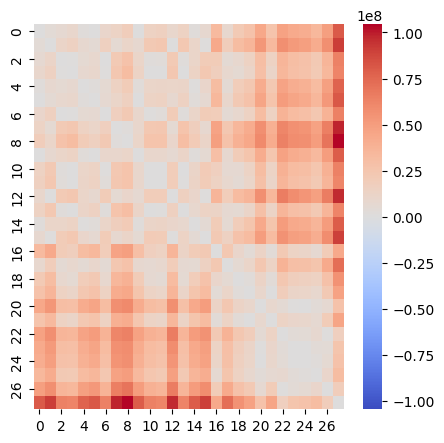

1 6641 586920450.0846936
2 6642 735263563.055372
3 6644 465520718.1367183
4 6648 473629803.24283785
5 6650 556235220.6128156
6 6654 596020868.8251616
7 10175 465549234.11416745
8 3799 855749419.1652814
9 6666 951444081.1283865
10 3491 552677530.9689634
11 3816 495383872.44232845
12 6672 478416062.9481953
13 6679 792190234.7327176
14 6680 472889529.87159896
15 6683 586548681.8751714
16 6685 699382031.6172373
17 6687 618675972.530579
18 6689 499418791.0043194
19 6691 502411822.0903892
20 6693 544937831.737948
21 6694 787049982.4486623
22 6695 523717164.1430683
23 6698 926641598.2078676
24 6699 796949277.4588623
25 6700 759151190.9527489
26 3801 662865485.6626253
27 6706 971952529.1180608
28 7013 1669901695.6861727


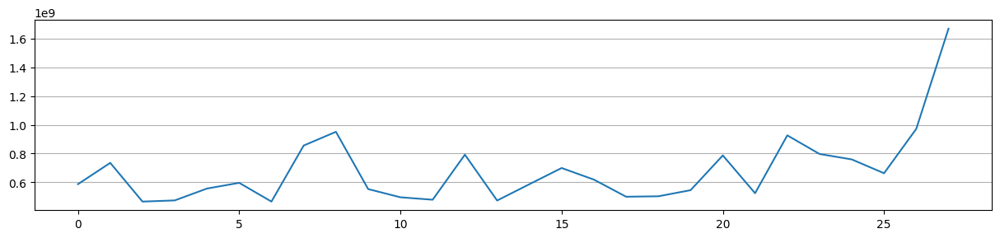

********************************* PM_LI INTENSIDAD *********************************


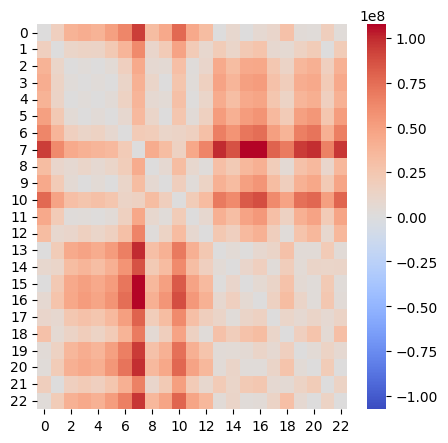

1 6643 662310198.9902912
2 6645 439736262.218431
3 6647 514539257.25363404
4 6649 562927766.2513312
5 6651 508700919.60157514
6 6655 625221606.9376432
7 10265 869799151.4665316
8 3819 1438693865.87678
9 3800 459675154.63337904
10 3488 549686416.0051944
11 3490 1064562124.8792871
12 3492 560027091.3949091
13 6670 492582817.98017836
14 6673 669042453.1847365
15 6677 564981174.6110748
16 6681 738475868.2845008
17 7125 822953637.5511667
18 6813 519141260.8934889
19 10180 499835816.66319126
20 6815 633542722.4174376
21 6817 707440561.7907666
22 7130 461878844.9865422
23 7014 694941118.1589572


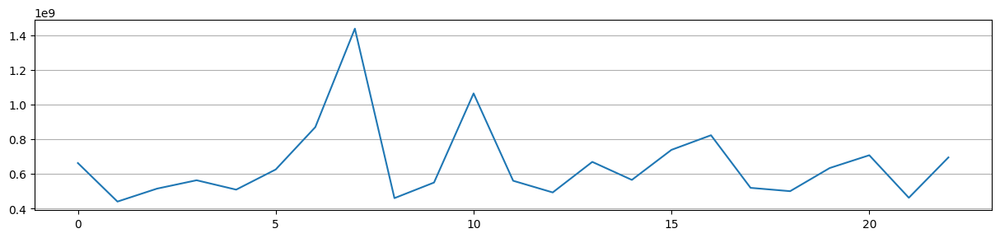

********************************* PM_TE INTENSIDAD *********************************


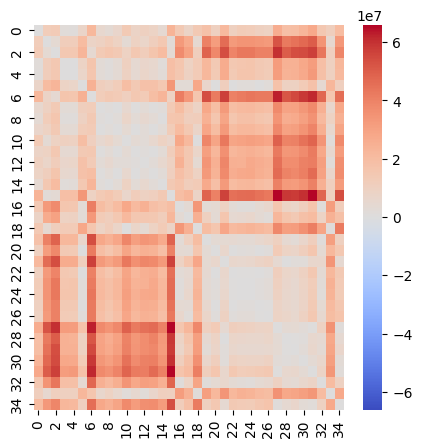

1 6713 442584524.91665196
2 3823 806869121.7159641
3 6715 987859776.532436
4 6717 475737396.74694246
5 6720 468930010.11125016
6 6722 403790402.1920278
7 6725 1073867027.4205582
8 6729 533687362.22488046
9 6732 495309159.5980797
10 6734 547391121.5808016
11 6737 725050655.0988845
12 6743 597257543.7087983
13 6746 643021694.8430879
14 6749 663662754.819761
15 6753 593236242.0229747
16 6758 1045433902.1467968
17 6763 515971427.27105826
18 6765 481505130.64098984
19 3532 651476581.0030863
20 3533 643832675.5419188
21 6766 500109102.40349615
22 6768 740176337.9422933
23 3836 504866005.3424509
24 3558 527658456.5300302
25 6769 536697904.9176258
26 3597 508225874.7301699
27 6770 506442968.5459187
28 3598 891673847.7524166
29 3599 698329050.3543379
30 3560 703372675.8876413
31 6771 787066755.0233546
32 3494 914503979.4275209
33 6772 579549100.088192
34 6775 603384163.9259281
35 6934 731128229.5702434


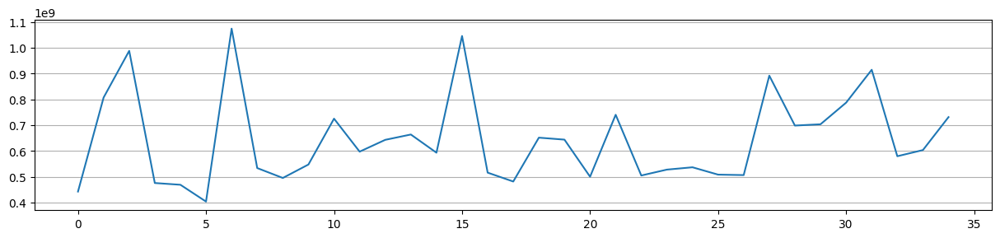

********************************* PM_LE INTENSIDAD *********************************


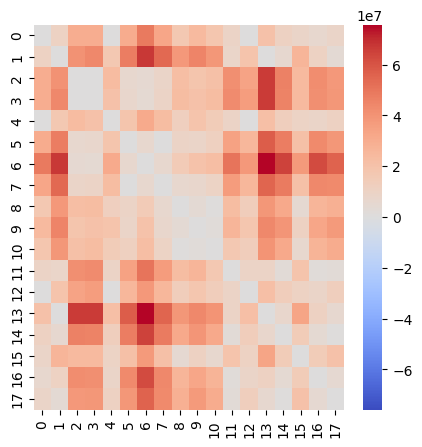

1 6714 306160430.4141412
2 6716 478183110.9075534
3 6723 469670423.9490246
4 6726 477874236.91425437
5 6730 252358563.419505
6 6735 414589420.12383425
7 6738 611660018.97855
8 6739 432081528.3098805
9 6744 315346005.344485
10 6750 379306005.0724952
11 10179 326415997.9540204
12 6754 345606972.01367414
13 6761 300735030.1395093
14 6948 575850965.2477981
15 3559 426818636.8565713
16 6697 305457464.8705626
17 6816 391373986.0464366
18 6935 384413552.75363076


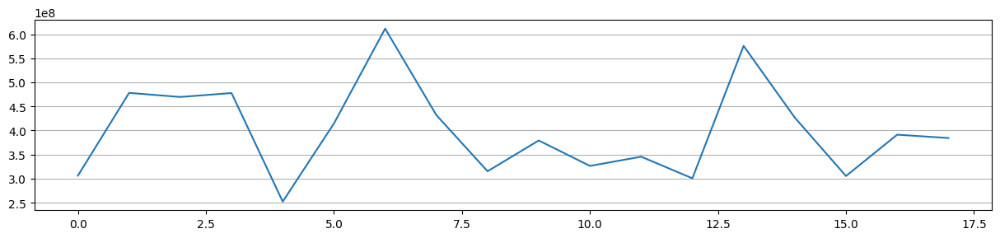

In [20]:
print("********************************* PM_TI INTENSIDAD *********************************")
buscaOutlayers(ids_PM_TI)
print("********************************* PM_LI INTENSIDAD *********************************")
buscaOutlayers(ids_PM_LI)
print("********************************* PM_TE INTENSIDAD *********************************")
buscaOutlayers(ids_PM_TE)
print("********************************* PM_LE INTENSIDAD *********************************")
buscaOutlayers(ids_PM_LE)


In [21]:
# Exportando datos
ids_PM_full = [ids_PM_TI, ids_PM_LI, ids_PM_TE, ids_PM_LE, ids_PM_nn]
# Archivo de los datos
nombrearchivo = "outputdata_m30_fulldates/m30_2024_data_fulldates_intensidad.txt"
datafile = open(nombrearchivo ,"w")
datafile.write(str(cantSensFinal)+" "+str(numFechas)+"\n")
for ids in ids_PM_full:
    for s in ids:
        datafile.write(str(s)+" ")
datafile.write("\n")
for ids in ids_PM_full:
    for s in ids:
        pos = dicc_posID[s]
        for c in range(numFechas):
            datafile.write(str(int(grillaIntensidad[pos][c]))+" ")
        datafile.write("\n")
datafile.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Archivo outputdata_m30_fulldates/m30_2024_data_fulldates_intensidad.txt escrito correctamente.


In [22]:
def exportarArchivoVecinos(diccVecinos, nombrearchivo):
    neigborfile = open(nombrearchivo,"w")
    neigborfile.write(str(len(diccVecinos))+"\n")
    for s in diccVecinos:
        neigborfile.write(str(s)+" ")
    neigborfile.write("\n")
    for s in diccVecinos:
        neigborfile.write(str(s) + " ")
        vec = diccVecinos[s]
        neigborfile.write(str(len(vec)))
        for v in vec:
            neigborfile.write(" " + str(v))
        neigborfile.write("\n")
    neigborfile.close()
    print("Archivo", nombrearchivo, "escrito correctamente.")

In [23]:
# Archivo para la construcción de la estructura
nombrearchivo = "outputdata_m30_fulldates/m30_2024_ids_estructura_intensidad.txt"
archivo = open(nombrearchivo,"w")
for ids in ids_PM_full:
    archivo.write(str(len(ids))+" ")
archivo.write("\n")
for ids in ids_PM_full:
    for ide in ids:
        archivo.write(str(ide)+" ")
    archivo.write("\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Archivo outputdata_m30_fulldates/m30_2024_ids_estructura_intensidad.txt escrito correctamente.


In [24]:
# Archivo de lista de vecindad
nombrearchivo = "outputdata_m30_fulldates/m30_2024_listaVecindad_intensidad.txt"
archivo = open(nombrearchivo,"w")
archivo.write(str(len(list_Cods_final)) + "\n")
for ids in ids_PM_full:
    for ide in ids:
        archivo.write(str(ide)+" ")
archivo.write("\n")
for ids in ids_PM_full:
    tope = len(ids)
    for i in range(tope):
        archivo.write(str(ids[i]) + " 1 " + str(ids[i-1]) + "\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Archivo outputdata_m30_fulldates/m30_2024_listaVecindad_intensidad.txt escrito correctamente.


In [25]:
ids_PM_nn_SinOutlayers = ids_PM_nn.copy()
# Troncal Interior - Se elimina el 7013
ids_PM_TI_SinOutlayers = [6641, 6642, 6644, 6648, 6650, 6654, 10175, 3799, 6666, 3491, 3816, 6672, 6679, 6680, 6683, 6685, 6687, 6689, 6691, 6693, 6694, 6695, 6698, 6699, 6700, 3801, 6706]
ids_PM_nn_SinOutlayers.append(7013)
# Lateral Interior - Se eliminan sobre 1e9: [3819, 3490]
ids_PM_LI_SinOutlayers = [6643, 6645, 6647, 6649, 6651, 6655, 10265, 3800, 3488, 3492, 6670, 6673, 6677, 6681, 7125, 6813, 10180, 6815, 6817, 7130, 7014]
ids_PM_nn_SinOutlayers += [3819, 3490]
# Troncal Exterior - Se eliminan sobre 0.8e9: [3823, 6715, 3598, 3494, 6758, 6725]
ids_PM_TE_SinOutlayers = [6713, 6717, 6720, 6722, 6729, 6732, 6734, 6737, 6743, 6746, 6749, 6753, 6763, 6765, 3532, 3533, 6766, 6768, 3836, 3558, 6769, 3597, 6770, 3599, 3560, 6771, 6772, 6775, 6934]
ids_PM_nn_SinOutlayers += [3823, 6715, 3598, 3494, 6758, 6725]
# Lateral Exterior - Se eliminan sobre 0.5e8: [6738, 6948]
ids_PM_LE_SinOutlayers = [6714, 6716, 6723, 6726, 6730, 6735, 6739, 6744, 6750, 10179, 6754, 6761, 3559, 6697, 6816, 6935]
ids_PM_nn_SinOutlayers += [6738, 6948]
ids_PM_full_SinOutlayers = [ids_PM_TI_SinOutlayers, ids_PM_LI_SinOutlayers, ids_PM_TE_SinOutlayers, ids_PM_LE_SinOutlayers, ids_PM_nn_SinOutlayers]

In [26]:
# Archivo para la construcción de la estructura
nombrearchivo = "outputdata_m30_fulldates/m30_2024_ids_estructura_sinOutlayers_intensidad.txt"
archivo = open(nombrearchivo,"w")
for ids in ids_PM_full_SinOutlayers:
    archivo.write(str(len(ids))+" ")
archivo.write("\n")
for ids in ids_PM_full_SinOutlayers:
    for ide in ids:
        archivo.write(str(ide)+" ")
    archivo.write("\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Archivo outputdata_m30_fulldates/m30_2024_ids_estructura_sinOutlayers_intensidad.txt escrito correctamente.


In [27]:
# Archivo de lista de vecindad
nombrearchivo = "outputdata_m30_fulldates/m30_2024_listaVecindad_SinOutlayers_intensidad.txt"
archivo = open(nombrearchivo,"w")
archivo.write(str(len(list_Cods_final)) + "\n")
for ids in ids_PM_full_SinOutlayers:
    for ide in ids:
        archivo.write(str(ide)+" ")
archivo.write("\n")
for ids in ids_PM_full_SinOutlayers:
    tope = len(ids)
    for i in range(tope):
        archivo.write(str(ids[i]) + " 1 " + str(ids[i-1]) + "\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Archivo outputdata_m30_fulldates/m30_2024_listaVecindad_SinOutlayers_intensidad.txt escrito correctamente.


In [28]:
# Calculando valores vs Diferencia con semana promedio por grupo
dicc_histograma_original = {}
dicc_histograma_diff_semanaXgrupo = {}
times_x_semana = 7 * 24 * 4
numSemanas = numFechas / times_x_semana
for lx in ids_PM_full_SinOutlayers:
    tope = len(lx)
    semana = np.zeros(times_x_semana)
    for i in range(tope):
        ids = lx[i]
        pos = dicc_posID[ids]
        for j in range(numFechas):
            val = grillaIntensidad[pos][j]
            semana[j % times_x_semana] += val
            if val not in dicc_histograma_original:
                dicc_histograma_original[val] = 1
            else:
                dicc_histograma_original[val] += 1
    for i in range(times_x_semana):
        semana[i] = int(semana[i] / numSemanas / len(lx))
    for i in range(tope):
        ids = lx[i]
        pos = dicc_posID[ids]
        for j in range(numFechas):
            val = grillaIntensidad[pos][j] - semana[j % times_x_semana]            
            if val not in dicc_histograma_diff_semanaXgrupo:
                dicc_histograma_diff_semanaXgrupo[val] = 1
            else:
                dicc_histograma_diff_semanaXgrupo[val] += 1

In [29]:
cants_original = list(dicc_histograma_original.keys())
cants_semanaXgrupo = list(dicc_histograma_diff_semanaXgrupo.keys())
cants_original.sort()
cants_semanaXgrupo.sort()

In [30]:
# Prueba para promedio de una semana para un sensor:
dicc_Or = {}
dicc_Pr = {}
semana = np.zeros(times_x_semana)
pos = dicc_posID[ids_PM_TI[0]]
sx = grillaIntensidad[pos]
print("len sx:", len(sx))
for i in range(len(sx)):
    if sx[i] not in dicc_Or:
        dicc_Or[sx[i]] = 1
    else:
        dicc_Or[sx[i]] += 1
    porcion = sx[i] / numSemanas
    semana[i % times_x_semana] += porcion
for i in range(times_x_semana):
    semana[i] = int(semana[i])
for i in range(len(sx)):
    val = sx[i] - semana[i % times_x_semana]            
    if val not in dicc_Pr:
        dicc_Pr[val] = 1
    else:
        dicc_Pr[val] += 1
cOr = list(dicc_Or.keys())
cOr.sort()
cPr = list(dicc_Pr.keys())
cPr.sort()
print("Prueba OR:", cOr[0], cOr[-1])
print("Prueba PR:", cPr[0], cPr[-1])

len sx: 35136
Prueba OR: 0 6000
Prueba PR: -4955.0 2851.0


In [31]:
# Método de un promedio por sensor
dicc_histograma_diff_semanaXsensor = {}
for lx in ids_PM_full_SinOutlayers:
    for idx in lx:
        semana = np.zeros(times_x_semana)
        pos = dicc_posID[idx]
        sx = grillaIntensidad[pos]
        for i in range(len(sx)):
            porcion = sx[i] / numSemanas
            semana[i % times_x_semana] += porcion
        for i in range(times_x_semana):
            semana[i] = int(semana[i])
        for i in range(len(sx)):
            val = sx[i] - semana[i % times_x_semana]
            if val not in dicc_histograma_diff_semanaXsensor:
                dicc_histograma_diff_semanaXsensor[val] = 1
            else:
                dicc_histograma_diff_semanaXsensor[val] += 1
cants_semanaXsensor = list(dicc_histograma_diff_semanaXsensor.keys())
cants_semanaXsensor.sort()

In [32]:
print("------ Rangos ------")
print("Original:\t", cants_original[0], "\t", cants_original[-1])
print("Metodo semana:\t", cants_semanaXgrupo[0], "\t", cants_semanaXgrupo[-1])
print("1 x sensor:\t", cants_semanaXsensor[0], "\t", cants_semanaXsensor[-1])


------ Rangos ------
Original:	 0 	 8452
Metodo semana:	 -4187.0 	 6686.0
1 x sensor:	 -7290.0 	 5007.0


In [33]:
histomin = min(min(int(cants_original[0]), int(cants_semanaXgrupo[0])), int(cants_semanaXsensor[0]))
histomax = max(max(int(cants_original[-1]), int(cants_semanaXgrupo[-1])), int(cants_semanaXsensor[-1]))
dataOriginal = []
dataSemanaXgrupo = []
dataSemanaXsensor = []
ejex = []
for i in range(histomin, histomax+1):
    ejex.append(i)
    if i in dicc_histograma_original:
        dataOriginal.append(dicc_histograma_original[i])
    else:
        dataOriginal.append(0)
    if i in dicc_histograma_diff_semanaXgrupo:
        dataSemanaXgrupo.append(dicc_histograma_diff_semanaXgrupo[i])
    else:
        dataSemanaXgrupo.append(0)
    if i in dicc_histograma_diff_semanaXsensor:
        dataSemanaXsensor.append(dicc_histograma_diff_semanaXsensor[i])
    else:
        dataSemanaXsensor.append(0)

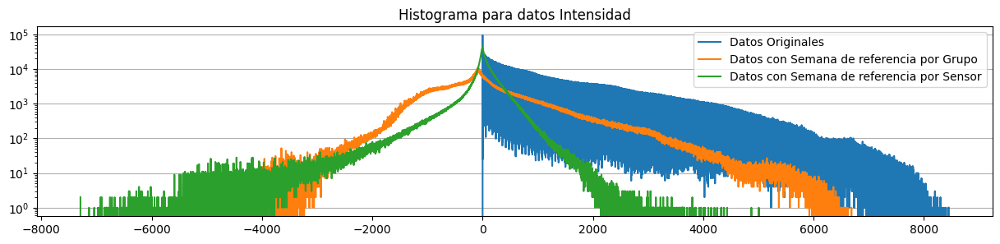

In [34]:
plt.figure(figsize=(15,3))
plt.plot(ejex, dataOriginal, label='Datos Originales')
plt.plot(ejex, dataSemanaXgrupo, label='Datos con Semana de referencia por Grupo')
plt.plot(ejex, dataSemanaXsensor, label='Datos con Semana de referencia por Sensor')
plt.title("Histograma para datos Intensidad")
#plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
plt.grid(axis='y')
plt.yscale('log')
plt.legend()
plt.show()
plt.close()

In [35]:
def plotSerie(idSerie):
    ps = dicc_posID[idSerie]
    if idSerie not in dicc_posID:
        print("ID " + str(idSerie) + " no encontrado")
        return
    plt.figure(figsize=(15,3))
    plt.plot(grillaIntensidadOriginal[ps], label="Original")
    plt.plot(grillaIntensidad[ps], label="Corregida")
    plt.title('Intensidad sensor '+str(idSerie))
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.legend()
    plt.show()
    plt.close()

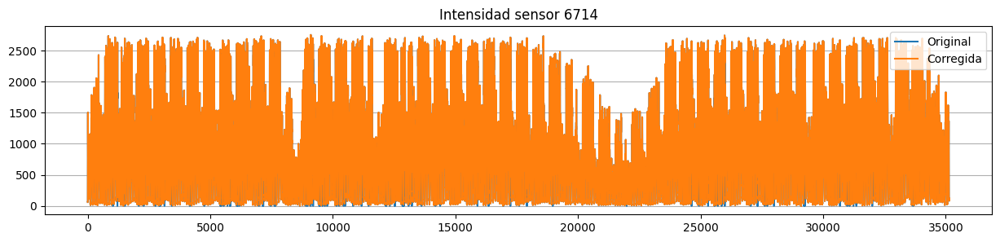

In [36]:
plotSerie(6714)

In [37]:
ticks = []
for i in range(8):
    ticks.append(i*24*4)

def plotPrimeraSemana(IDsSemana):
    plt.figure(figsize=(15,3))
    for i in IDsSemana:
        ps = dicc_posID[i]
        if i not in dicc_posID:
            print("ID " + str(i) + " no encontrado")
        plt.plot(grillaIntensidad[ps][:times_x_semana], label=str(i))
    plt.title('Intensidad 1a Semana')
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.xticks(ticks)
    plt.legend(loc='center right', bbox_to_anchor=(1.1, 0.5))
    plt.show()
    plt.close()

def plotSegundaSemana(IDsSemana):
    plt.figure(figsize=(15,3))
    for i in IDsSemana:
        ps = dicc_posID[i]
        if i not in dicc_posID:
            print("ID " + str(i) + " no encontrado")
        plt.plot(grillaIntensidad[ps][times_x_semana:2*times_x_semana], label=str(i))
    plt.title('Intensidad 2a Semana')
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.xticks(ticks)
    plt.legend(loc='center right', bbox_to_anchor=(1.1, 0.5))
    plt.show()
    plt.close()

def plotUltimaSemana(IDsSemana):
    timesAux = numFechas - times_x_semana
    plt.figure(figsize=(15,3))
    for i in IDsSemana:
        ps = dicc_posID[i]
        if i not in dicc_posID:
            print("ID " + str(i) + " no encontrado")
        plt.plot(grillaIntensidad[ps][timesAux:], label=str(i))
    plt.title('Intensidad Última Semana')
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.xticks(ticks)
    plt.legend(loc='center right', bbox_to_anchor=(1.1, 0.5))
    plt.show()
    plt.close()



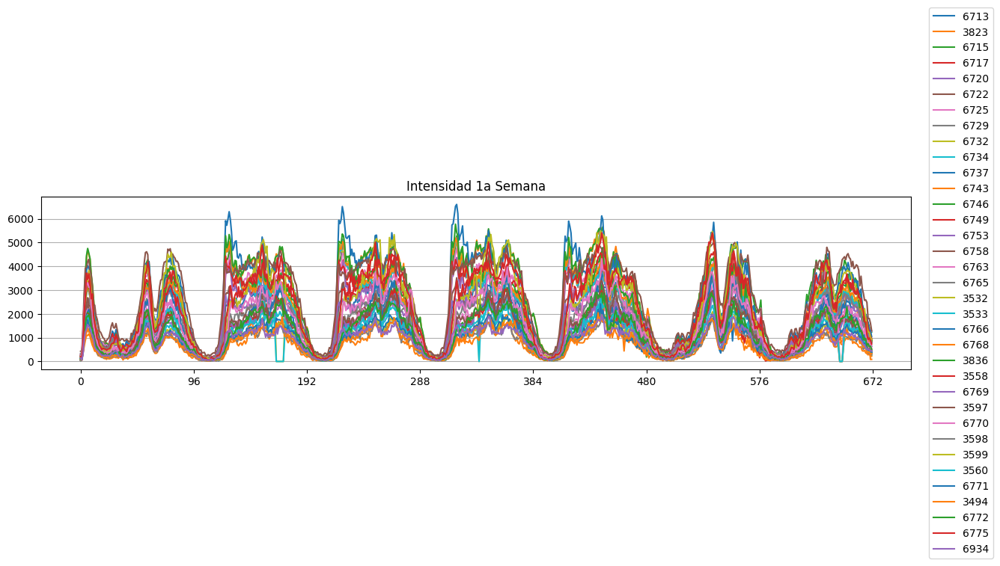

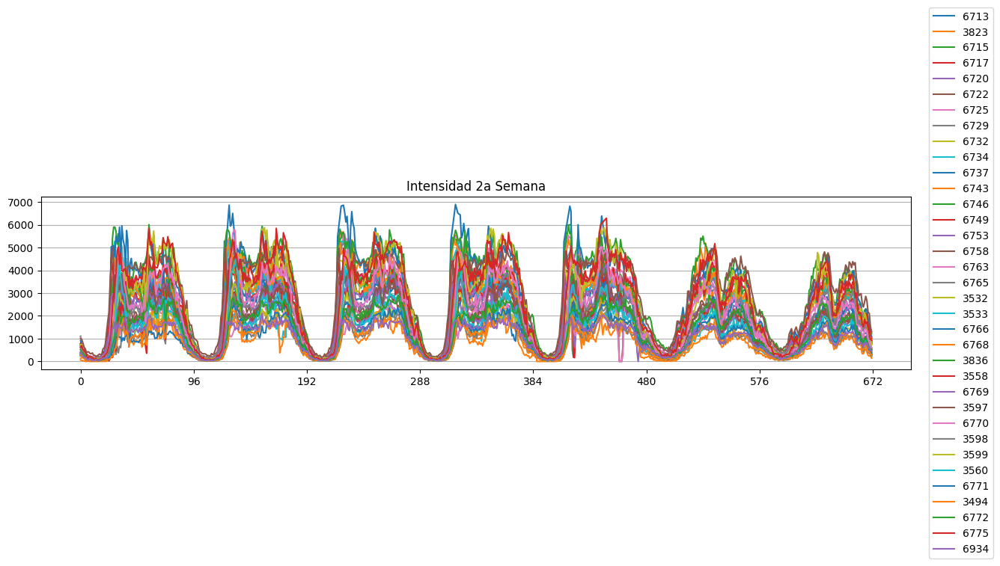

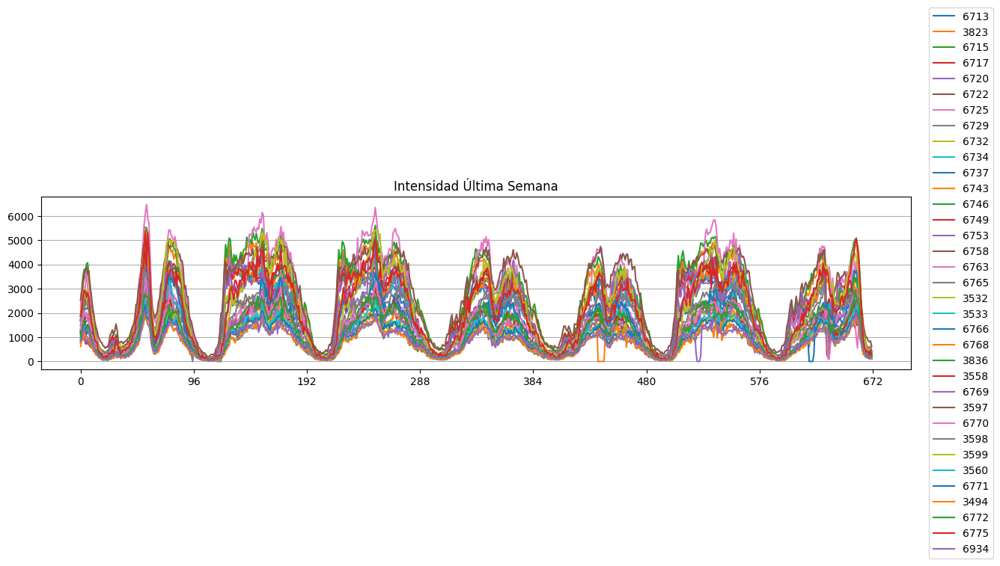

In [38]:
plotPrimeraSemana(ids_PM_TE)
plotSegundaSemana(ids_PM_TE)
plotUltimaSemana(ids_PM_TE)

In [39]:
def estadisticasListaIDs(listaIDs):
    acumTotal = 0
    for ids in listaIDs:
        acumLista = 0
        ps = dicc_posID[ids]
        for x in grillaIntensidad[ps]:
            acumLista += x
        acumTotal += float(acumLista) / numFechas
    minimo = x
    maximo = x
    promedioTotal = acumTotal / len(listaIDs)
    sumatoria = 0
    for ids in listaIDs:
        ps = dicc_posID[ids]
        minimo = min(minimo, min(grillaIntensidad[ps]))
        maximo = max(maximo, max(grillaIntensidad[ps]))
        for x in grillaIntensidad[ps]:
            diferencia = x - promedioTotal
            sumatoria += (diferencia * diferencia)
    varianza = sumatoria / (len(listaIDs) * numFechas)
    desviacion = math.sqrt(varianza)
    print("Mínimo:", minimo)
    print("Máximo:", maximo)
    print("Promedio:", round(promedioTotal,2))
    print("Varianza:", round(varianza,2))
    print("Desviación estándar:", round(desviacion,2))
    

In [40]:
print("********************************* Estadísticas PM_TI INTENSIDAD *********************************")
estadisticasListaIDs(ids_PM_TI)
print("********************************* Estadísticas PM_LI INTENSIDAD *********************************")
estadisticasListaIDs(ids_PM_LI)
print("********************************* Estadísticas PM_TE INTENSIDAD *********************************")
estadisticasListaIDs(ids_PM_TE)
print("********************************* Estadísticas PM_LE INTENSIDAD *********************************")
estadisticasListaIDs(ids_PM_LE)
print("********************************* Estadísticas PM_NN INTENSIDAD *********************************")
estadisticasListaIDs(ids_PM_nn)
print("********************************* Estadísticas TODOS INTENSIDAD *********************************")
estadisticasListaIDs(list_IDs_final)

********************************* Estadísticas PM_TI INTENSIDAD *********************************
Mínimo: 0
Máximo: 8452
Promedio: 2146.2
Varianza: 3029414.27
Desviación estándar: 1740.52
********************************* Estadísticas PM_LI INTENSIDAD *********************************
Mínimo: 0
Máximo: 8105
Promedio: 1547.53
Varianza: 2216154.83
Desviación estándar: 1488.68
********************************* Estadísticas PM_TE INTENSIDAD *********************************
Mínimo: 0
Máximo: 7135
Promedio: 1909.47
Varianza: 2091666.91
Desviación estándar: 1446.26
********************************* Estadísticas PM_LE INTENSIDAD *********************************
Mínimo: 0
Máximo: 5123
Promedio: 1346.65
Varianza: 1304222.81
Desviación estándar: 1142.03
********************************* Estadísticas PM_NN INTENSIDAD *********************************
Mínimo: 0
Máximo: 6904
Promedio: 910.84
Varianza: 825502.78
Desviación estándar: 908.57
********************************* Estadísticas TODOS INTENS

In [41]:
def estadisticasListaValores(listaValores):
    acumulado = 0
    for x in listaValores:
        acumulado += x
    promedio = float(acumulado) / len(listaValores)
    sumatoria = 0
    for x in listaValores:
        diferencia = x - promedio
        sumatoria += (diferencia * diferencia)
    varianza = sumatoria / len(listaValores)
    desviacion = math.sqrt(varianza)
    print("Mínimo:", min(listaValores))
    print("Máximo:", max(listaValores))
    print("Promedio:", round(promedio,2))
    print("Varianza:", round(varianza,2))
    print("Desviación estándar:", round(desviacion,2))

In [42]:
def estadisticasHistograma(listaValores):
    acumulado = 0
    minimo = histomax
    maximo = histomin
    valor = histomin
    cantidad = 0
    for x in listaValores:
        if x > 0:
            acumulado += (x * valor)
            cantidad += x
            minimo = min(minimo, valor)
            maximo = max(maximo, valor)
        valor += 1
    promedio = float(acumulado) / cantidad
    sumatoria = 0
    valor = histomin
    for x in listaValores:
        diferencia = valor - promedio
        sumatoria += (diferencia * diferencia * x)
        valor += 1
    varianza = sumatoria / cantidad
    desviacion = math.sqrt(varianza)
    print("Mínimo:", minimo)
    print("Máximo:", maximo)
    print("Promedio:", round(promedio,2))
    print("Varianza:", round(varianza,2))
    print("Desviación estándar:", round(desviacion,2))

In [43]:
print(" *************************** Estadísticas Histograma INTENSIDAD datos Originales ***************************")
estadisticasHistograma(dataOriginal)
print(" *************************** Estadísticas Histograma INTENSIDAD datos Semana por grupo ***************************")
estadisticasHistograma(dataSemanaXgrupo)
print(" *************************** Estadísticas Histograma INTENSIDAD datos Semana por sensor ***************************")
estadisticasHistograma(dataSemanaXsensor)

 *************************** Estadísticas Histograma INTENSIDAD datos Originales ***************************
Mínimo: 0
Máximo: 8452
Promedio: 1294.3
Varianza: 1665979.62
Desviación estándar: 1290.73
 *************************** Estadísticas Histograma INTENSIDAD datos Semana por grupo ***************************
Mínimo: -4187
Máximo: 6686
Promedio: -0.05
Varianza: 897070.71
Desviación estándar: 947.14
 *************************** Estadísticas Histograma INTENSIDAD datos Semana por sensor ***************************
Mínimo: -7290
Máximo: 5007
Promedio: -0.05
Varianza: 151967.8
Desviación estándar: 389.83


In [44]:
def plotHistograma(listaDiccValores, listaTitulos, tituloGrafica):
    arrMin = []
    arrMax = []
    for i in listaDiccValores:
        v = list(i.keys())
        arrMin.append(min(v))
        arrMax.append(max(v))
    print("Valores minimos:", arrMin)
    print("Valores máximos:", arrMax)
    minmin = min(arrMin)
    maxmax = max(arrMax)
    plt.figure(figsize=(15,3))
    ejex = []
    for i in range(minmin, maxmax+1):
        ejex.append(i)
    for d in range(len(listaDiccValores)):
        valores = []
        for i in range(minmin, maxmax+1):
            if i in listaDiccValores[d]:
                valores.append(listaDiccValores[d][i])
            else:
                valores.append(0)
        plt.plot(ejex, valores, label=listaTitulos[d])
    plt.title("Histograma para datos Intensidad")
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    plt.legend()
    plt.show()
    plt.close()

In [45]:
def diccionarioHistoDeLista(lista):
    diccHisto = {}
    for x in lista:
        if x in diccHisto:
            diccHisto[x] += 1
        else:
            diccHisto[x] = 1
    return diccHisto

In [46]:
def diccionarioHistogramaPorID(idSensor):
    if idSensor not in dicc_posID:
        return {}
    ps = dicc_posID[idSensor]
    return diccionarioHistoDeLista(grillaIntensidad[ps])

Valores minimos: [np.int64(0), np.int64(0), np.int64(0)]
Valores máximos: [np.int64(6000), np.int64(7016), np.int64(4724)]


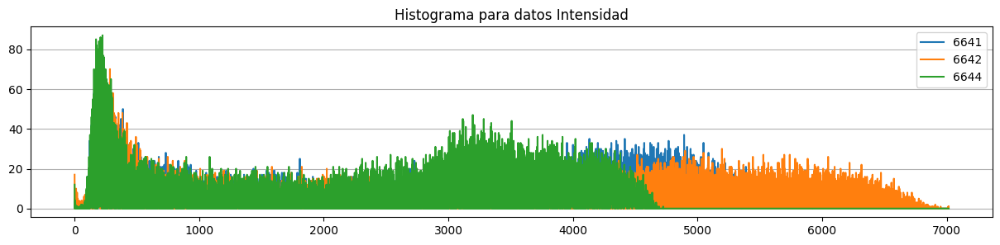

In [47]:
listadoDicc = []
listadoDicc.append(diccionarioHistogramaPorID(ids_PM_TI[0]))
listadoDicc.append(diccionarioHistogramaPorID(ids_PM_TI[1]))
listadoDicc.append(diccionarioHistogramaPorID(ids_PM_TI[2]))
listadoTitu = []
listadoTitu.append(str(ids_PM_TI[0]))
listadoTitu.append(str(ids_PM_TI[1]))
listadoTitu.append(str(ids_PM_TI[2]))
tit = "Histograma de prueba"
plotHistograma(listadoDicc, listadoTitu, tit)

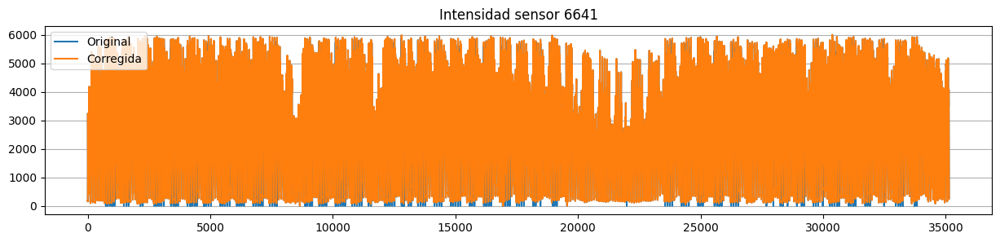

In [48]:
plotSerie(6641)

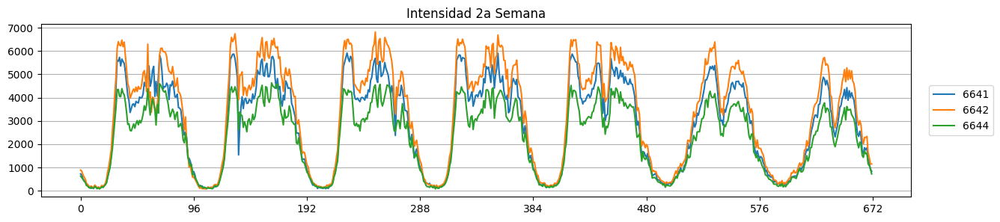

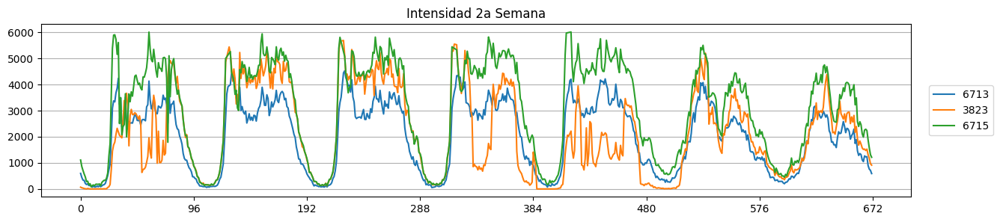

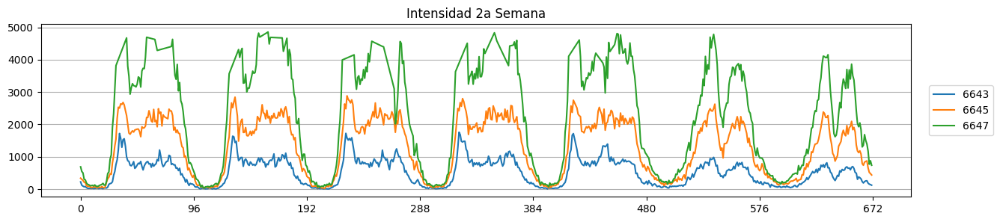

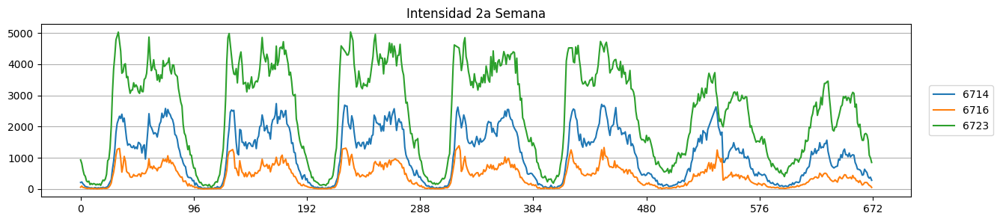

In [49]:
plotSegundaSemana(ids_PM_TI[:3])
plotSegundaSemana(ids_PM_TE[:3])
plotSegundaSemana(ids_PM_LI[:3])
plotSegundaSemana(ids_PM_LE[:3])

In [50]:
def graficaPromedioBloquesPorSerie(listaIDs, numSeriesGrafica, numBloquesGrafica):
    if len(listaIDs) < numSeriesGrafica:
        numSeriesGrafica = len(listaIDs)
    promedio_horas = []
    for ids in listaIDs[:numSeriesGrafica]:
        ph = np.zeros(numBloquesGrafica)
        ps = dicc_posID[ids]
        for p in range(numFechas):
            ph[p%numBloquesGrafica] += grillaIntensidad[ps][p]
        muestrasXhora = numFechas/numBloquesGrafica
        for p in range(numBloquesGrafica):
            ph[p] = ph[p] / muestrasXhora
        promedio_horas.append(ph)
    plt.figure(figsize=(15,3))
    for s in range(numSeriesGrafica):
        plt.plot(promedio_horas[s], label=str(listaIDs[s]))
    plt.title('Promedio de Intensidad por '+str(numBloquesGrafica)+' bloques de 15m.')
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    ticks = range(numBloquesGrafica)
    #plt.xticks(ticks)
    plt.legend(loc='center right', bbox_to_anchor=(1.1, 0.5))
    plt.show()
    plt.close()

*********************************** Muestra para TI ***********************************


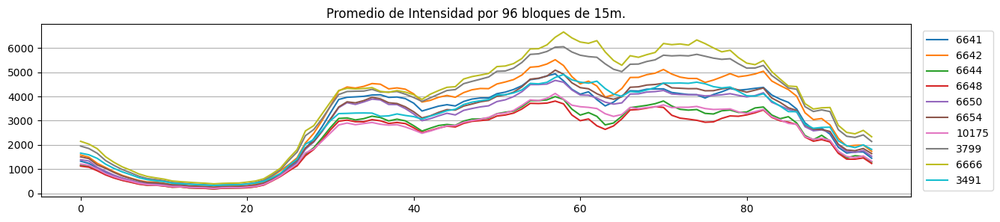

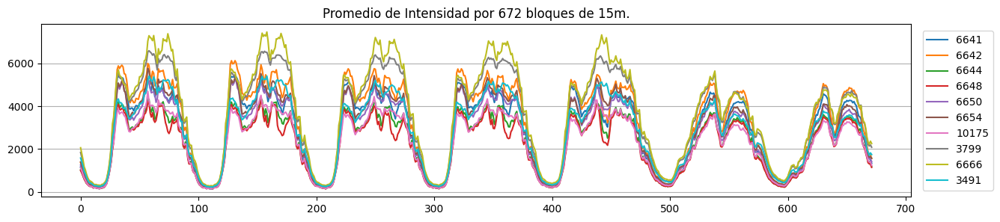

In [51]:
print("*********************************** Muestra para TI ***********************************")
graficaPromedioBloquesPorSerie(ids_PM_TI, 10, 96)
graficaPromedioBloquesPorSerie(ids_PM_TI, 10, 672)

*********************************** Muestra para TE ***********************************


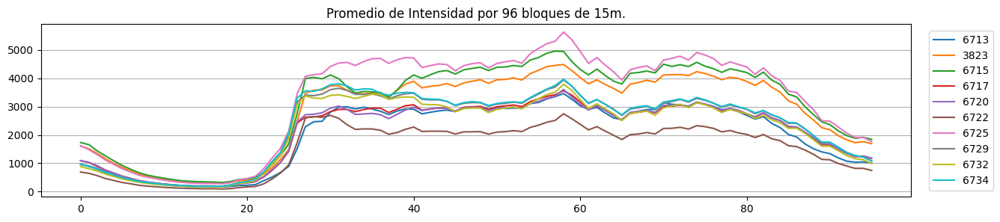

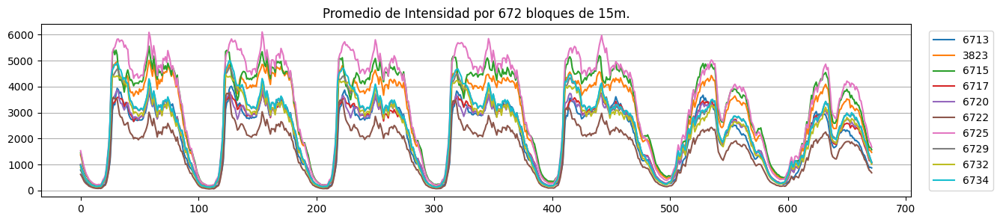

In [52]:
print("*********************************** Muestra para TE ***********************************")
graficaPromedioBloquesPorSerie(ids_PM_TE, 10, 96)
graficaPromedioBloquesPorSerie(ids_PM_TE, 10, 672)

*********************************** Muestra para LI ***********************************


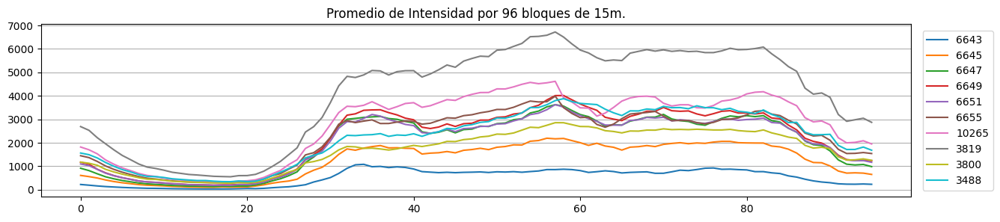

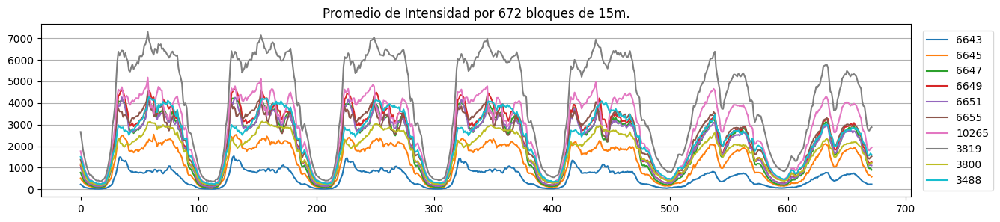

In [53]:
print("*********************************** Muestra para LI ***********************************")
graficaPromedioBloquesPorSerie(ids_PM_LI, 10, 96)
graficaPromedioBloquesPorSerie(ids_PM_LI, 10, 672)

*********************************** Muestra para LE ***********************************


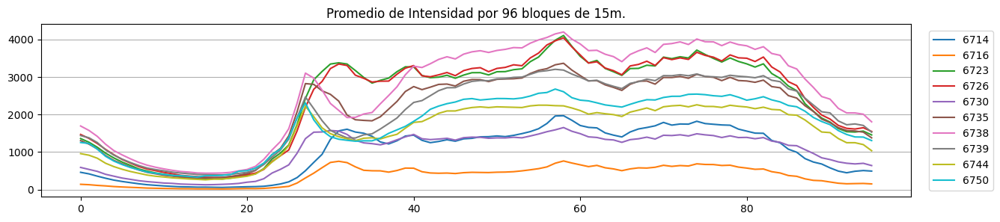

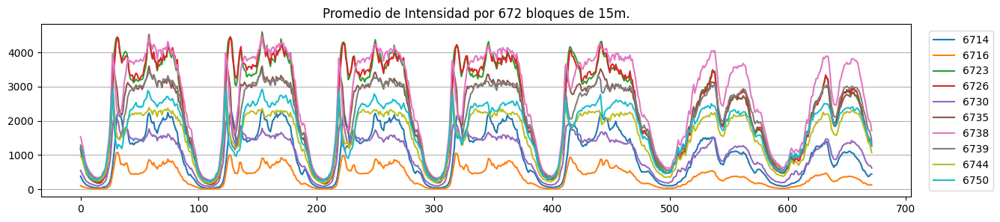

In [54]:
print("*********************************** Muestra para LE ***********************************")
graficaPromedioBloquesPorSerie(ids_PM_LE, 10, 96)
graficaPromedioBloquesPorSerie(ids_PM_LE, 10, 672)

*********************************** Muestra para nn ***********************************


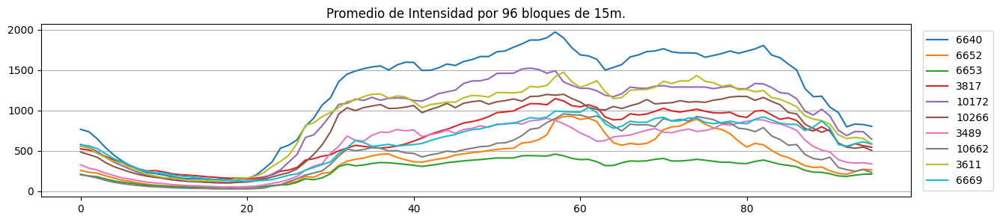

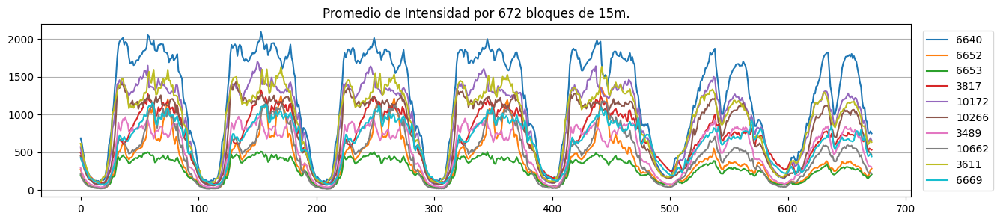

In [55]:
print("*********************************** Muestra para nn ***********************************")
graficaPromedioBloquesPorSerie(ids_PM_nn, 10, 96)
graficaPromedioBloquesPorSerie(ids_PM_nn, 10, 672)

In [56]:
def distanciaEuclideaSerie(listaA, listaB):
    if len(listaA) != len(listaB):
        print("Error! el largo de la lista no coincide.")
        return 'Error'
    sumatoria = 0
    n = len(listaA)
    for i in range(n):
        dif = listaA[i] - listaB[i]
        sumatoria += (dif * dif)
    distEucSerie = sumatoria / n
    return sumatoria

In [57]:
def matrizDistanciaEuclideaSerie(listaIDs, factor):
    numSeries = len(listaIDs)
    matriz = np.zeros((numSeries, numSeries))
    for i in range(numSeries):
        id1 = listaIDs[i]
        if id1 in dicc_posID:
            ps1 = dicc_posID[id1]
            for j in range(i+1, numSeries):
                id2 = listaIDs[j]
                if id2 in dicc_posID:
                    ps2 = dicc_posID[id2]
                    des = distanciaEuclideaSerie(grillaIntensidad[ps1], grillaIntensidad[ps2])
                    des /= factor
                    matriz[i][j] = des
                    matriz[j][i] = des
    for i in range(numSeries):
        print("\t"+str(listaIDs[i]), end="")
    print("")
    for i in range(numSeries):
        print(listaIDs[i], end="\t")
        for j in range(numSeries):
            print(round(matriz[i][j], 2), end="\t")
        print("")
    return matriz

In [58]:
m = matrizDistanciaEuclideaSerie(ids_PM_TI[:10], 1000000000)

	6641	6642	6644	6648	6650	6654	10175	3799	6666	3491
6641	0.0	16.41	17.89	25.41	11.11	11.83	23.23	36.08	58.97	15.42	
6642	16.41	0.0	50.58	62.43	25.45	19.81	55.86	26.81	42.61	28.86	
6644	17.89	50.58	0.0	2.08	16.47	24.06	3.89	81.27	113.3	22.4	
6648	25.41	62.43	2.08	0.0	23.67	32.34	6.32	98.89	134.55	32.14	
6650	11.11	25.45	16.47	23.67	0.0	7.79	17.35	43.92	66.58	11.92	
6654	11.83	19.81	24.06	32.34	7.79	0.0	22.9	34.91	54.94	11.83	
10175	23.23	55.86	3.89	6.32	17.35	22.9	0.0	77.91	108.56	19.08	
3799	36.08	26.81	81.27	98.89	43.92	34.91	77.91	0.0	5.35	29.21	
6666	58.97	42.61	113.3	134.55	66.58	54.94	108.56	5.35	0.0	45.42	
3491	15.42	28.86	22.4	32.14	11.92	11.83	19.08	29.21	45.42	0.0	


In [59]:
m = matrizDistanciaEuclideaSerie(list_IDs_final, 1000000000)

	6640	6641	6642	6643	6644	6645	6647	6648	6649	6650	6651	6652	6653	6654	6655	10175	10265	3817	3819	10172	10266	3799	3800	6666	3488	3489	10662	3611	6669	6668	3490	3491	3492	3493	3816	6670	6671	6672	6673	6674	7124	6677	6678	6679	6680	6681	6682	6683	6684	6685	6686	6687	6688	6689	10660	6691	7125	6693	6694	6813	6695	10659	10180	6698	6815	6817	6699	6700	3801	6706	6707	7130	7013	7014	6713	3821	3822	3823	6714	6715	6716	6717	6719	6720	6722	6723	6725	6726	6729	6730	6731	6732	10661	6734	6735	6736	10194	6737	6738	6739	6740	6742	6741	10267	6743	6744	6745	6746	7126	6748	10177	6749	6750	10179	10178	6753	6754	6755	6757	6758	6759	6760	6761	6763	6764	6765	3531	3532	3533	6948	6766	6768	3836	3558	3559	6769	6697	3597	6816	6770	3598	3599	3560	6771	3494	6772	6774	6775	6934	6935	3521	6712	3837	3539	3536	6819	3495	3561	6667	3600	3838	3839	6777	7127	6778	6779	6822	6780	6938	6939	6942	6941	6949	6950	6781	6782	3496	6783	6784	6785	6932	7128	3797	10198	10200	10201	10199	3538	6789	10176	6661	6790	7131	3827	3828	3826	

3819 6795 6778 6726


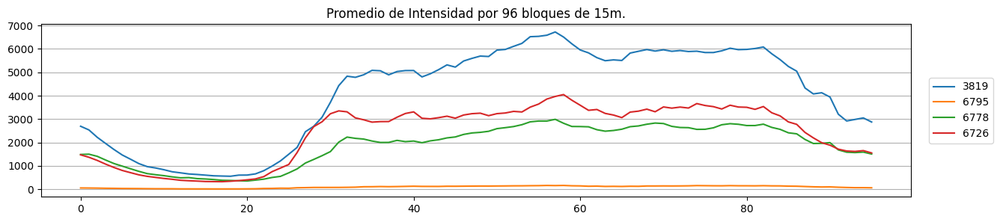

In [60]:
maxmatriz = m[0][1]
fmax = [0]
cmax = [1]
for f in range(len(m)):
    for c in range(len(m[f])):
        if m[f][c] > maxmatriz:
            maxmatriz = m[f][c]
            fmax = f
            cmax = c
idF = list_IDs_final[fmax]
idC = list_IDs_final[cmax]
distF = m[fmax].copy()
distF.sort()
vft = distF[0] + ((distF[-1] - distF[0])/3)
i = 0
while distF[i] < vft:
    i+=1
vft = distF[i]
ftercio = 0
while ftercio < len(m) and m[fmax][ftercio] != vft:
    ftercio+=1
idFM = list_IDs_final[ftercio]
distC = m[cmax].copy()
distC.sort()
vct = distC[0] + ((distC[-1] - distC[0])/3)
i = 0
while distC[i] < vct:
    i+=1
vct = distC[i]
ctercio = 0
while ctercio < len(m) and m[cmax][ctercio] != vct:
    ctercio+=1
idCM = list_IDs_final[ctercio]
print(idF, idC, idFM, idCM)
l = [idF, idC, idFM, idCM]
graficaPromedioBloquesPorSerie(l, 4, 96)

In [61]:
# Generar los 4 grupos en base a las ids en la lista <l>

In [62]:
print(fmax, cmax, ftercio, ctercio)
print(list_IDs_final[fmax], list_IDs_final[cmax], list_IDs_final[ftercio], list_IDs_final[ctercio])
listA = []
listB = []
listC = []
listD = []
listasDES = [listA, listB, listC, listD]
listaPOS = [fmax, cmax, ftercio, ctercio]
print("max euc dist:", m[fmax][cmax])
for i in range(len(m)):
    minI = m[fmax][cmax]
    posMin = -1
    for j in range(len(listasDES)):
        if m[i][listaPOS[j]] < minI:
            minI = m[i][listaPOS[j]]
            posMin = j
    listasDES[posMin].append(list_IDs_final[i])
for lis in listasDES:
    print(len(lis))

18 216 164 87
3819 6795 6778 6726
max euc dist: 762.340193199
3
103
87
47


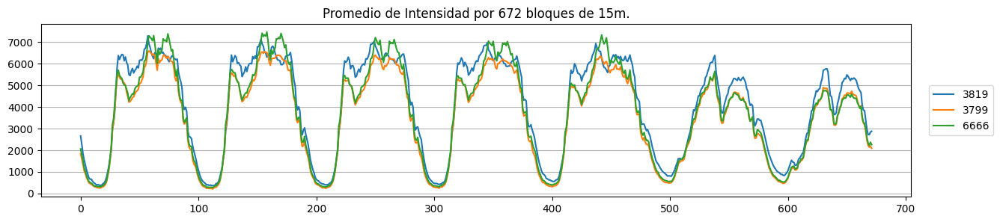

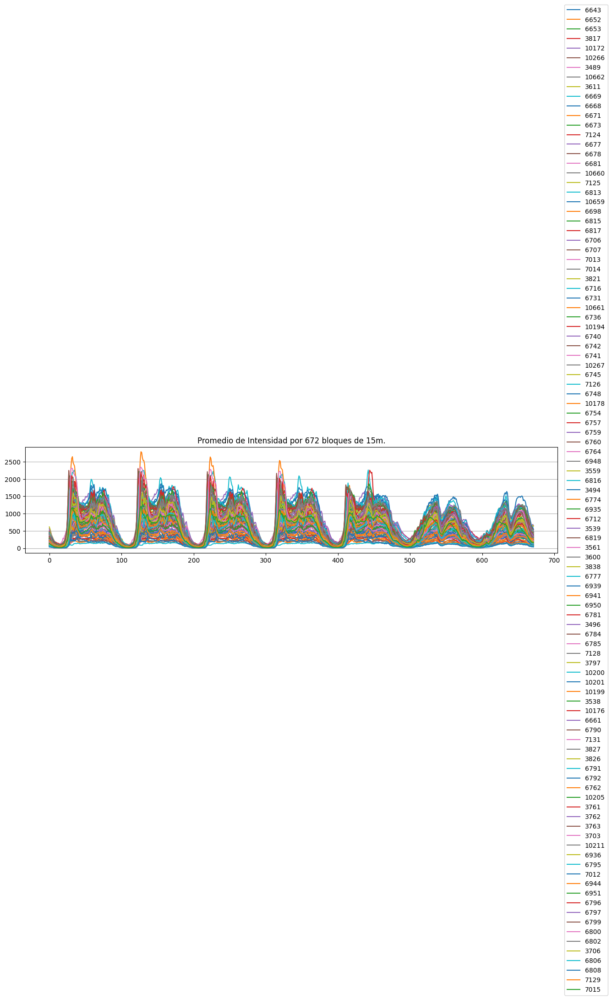

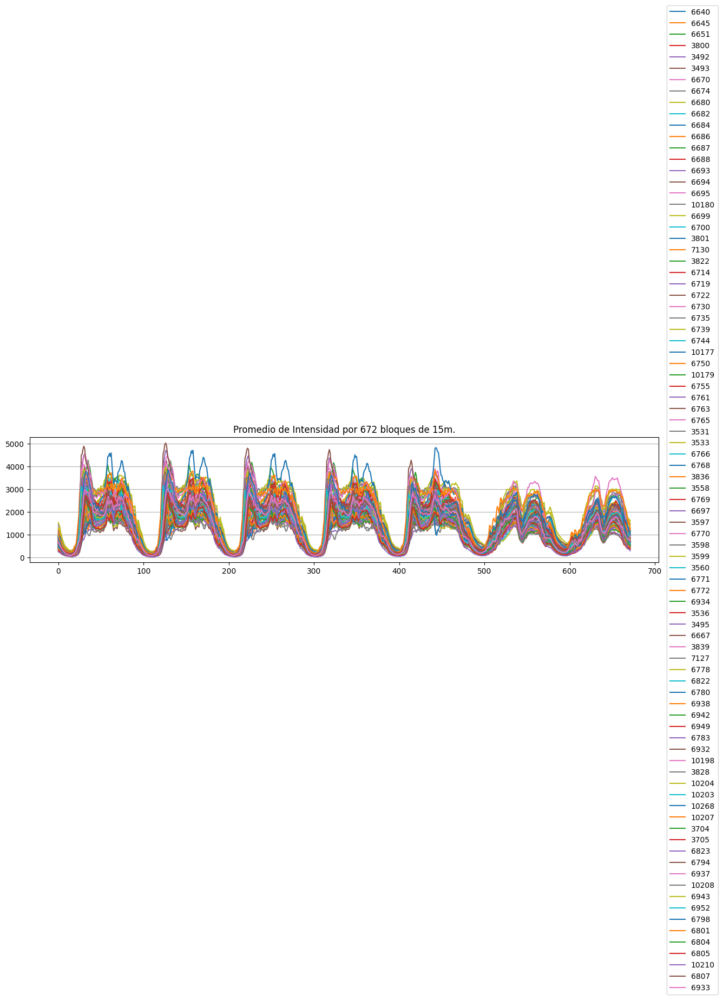

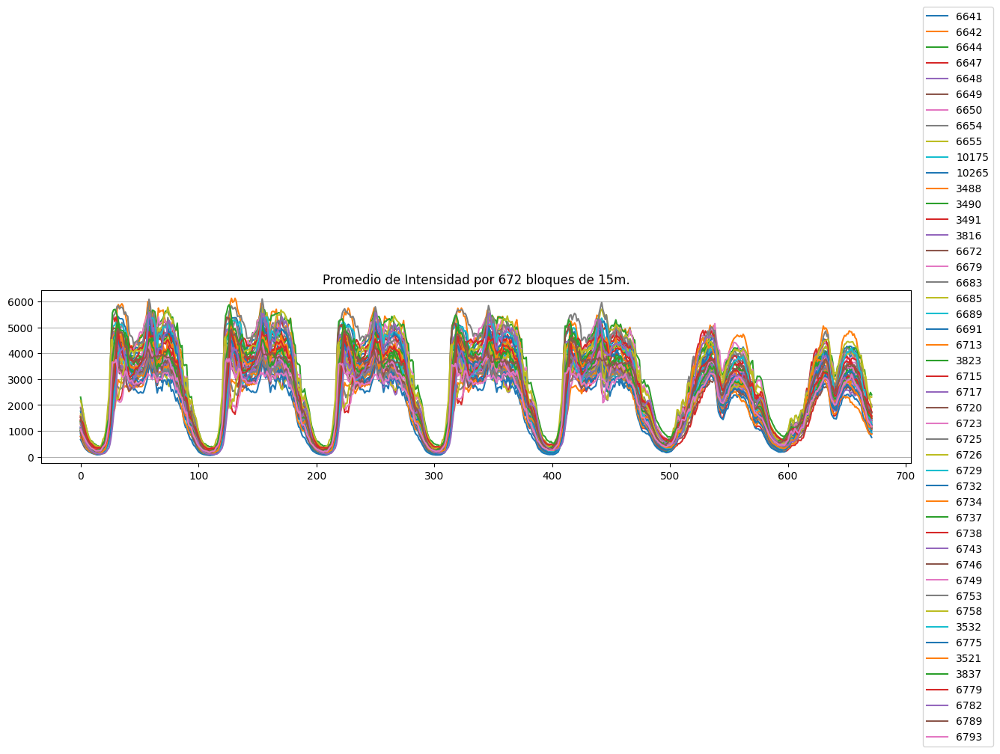

In [63]:
for lis in listasDES:
    graficaPromedioBloquesPorSerie(lis, len(lis), 672)

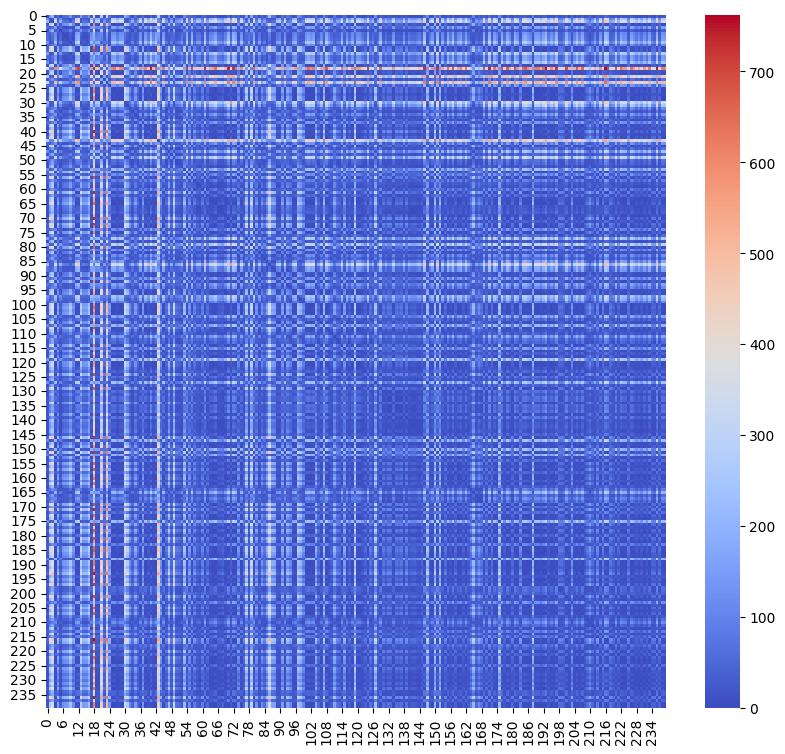

In [64]:
plt.figure(figsize=(10, 9))
#plt.axis('off')
heatmap = sns.heatmap(m, cmap=cmap)
#plt.savefig('image_filename.png', bbox_inches='tight')
plt.show()
plt.close()

240
48
240


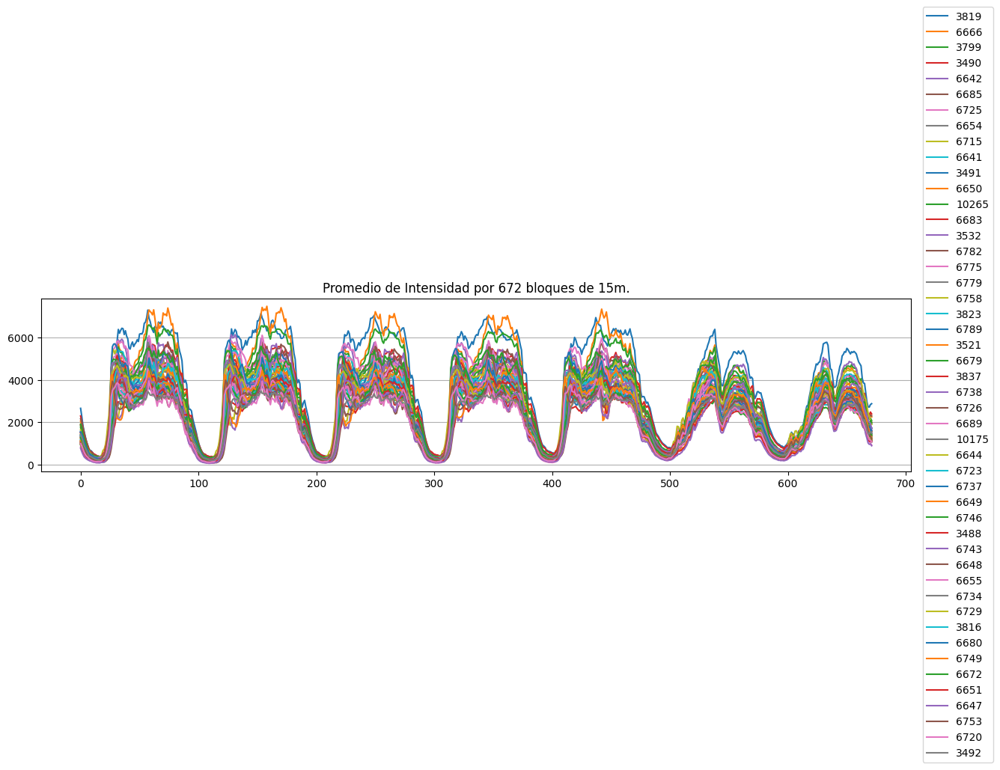

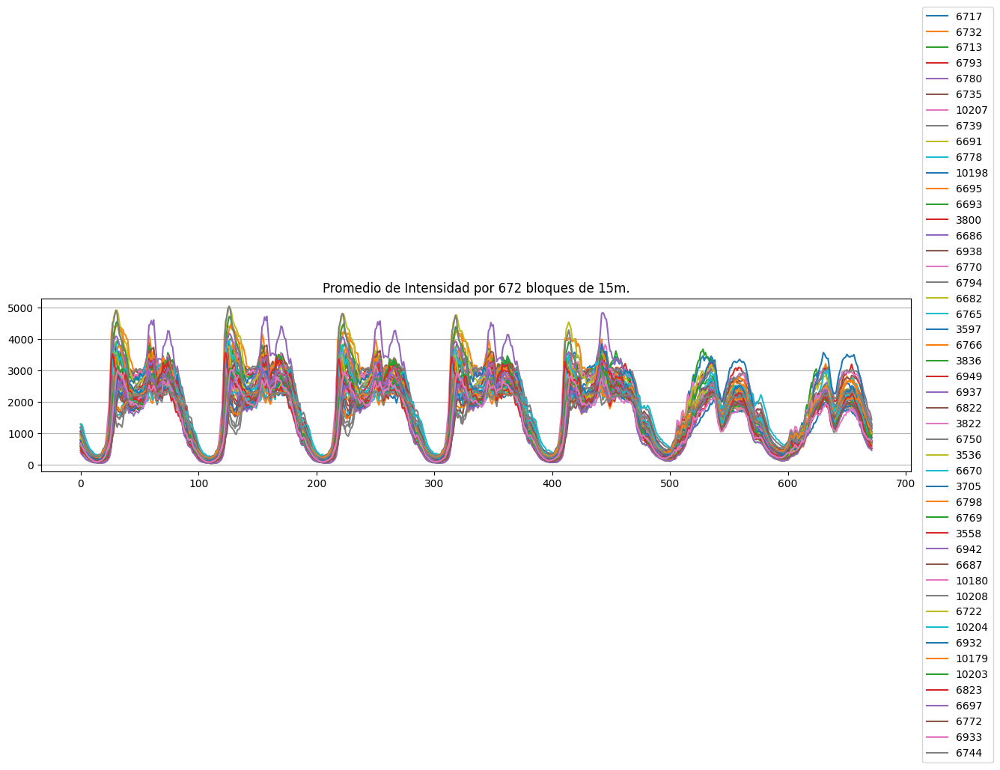

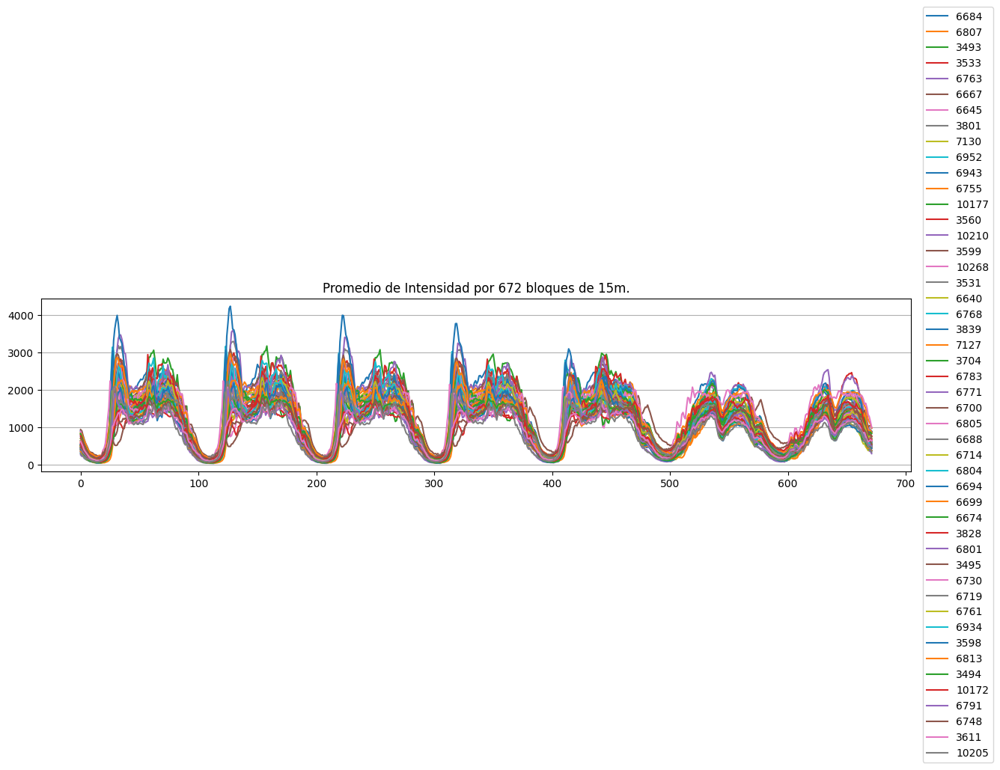

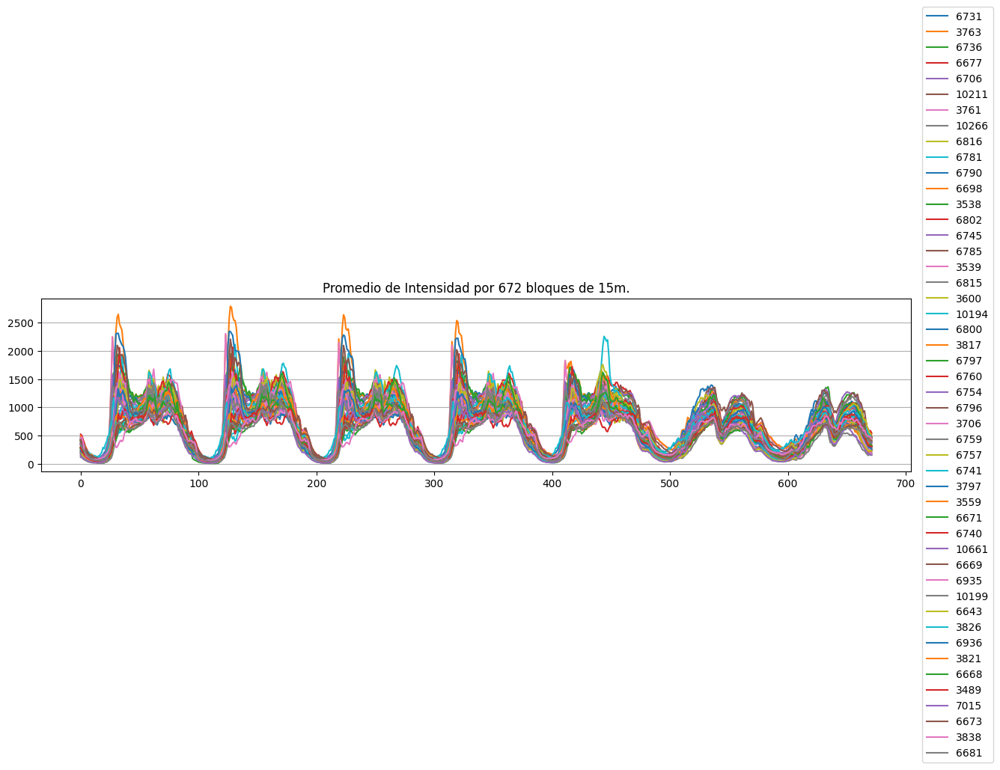

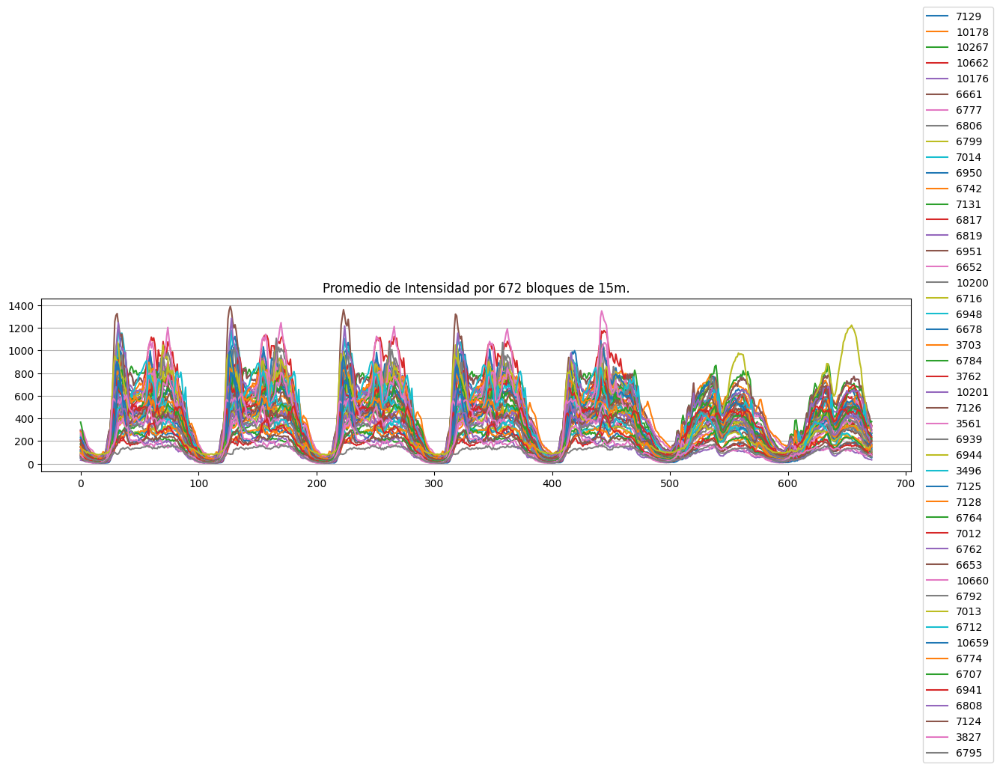

Archivo outputdata_m30_fulldates/m30_2024_ids_por_grupo_intensidad.txt escrito correctamente.


In [96]:
g1 = []
g2 = []
g3 = []
g4 = []
g5 = []
lgrupos = [g1, g2, g3, g4, g5]
ids_por_grupo = int(len(list_IDs_final) / 5)
print(len(list_IDs_final))
print(ids_por_grupo)
xesimo = 0
for g in lgrupos:
    # Buscar el xesimo elemento
    for x in range(ids_por_grupo):
        buscado = distF[xesimo]
        i = 0
        encontrado = False
        while i < len(list_IDs_final) and not encontrado:
            if m[fmax][i] == buscado:
                g.append(list_IDs_final[i])
                encontrado = True
            i += 1
        xesimo +=1
print(xesimo)
for g in lgrupos:
    graficaPromedioBloquesPorSerie(g, ids_por_grupo, 672)


# Archivo para la construcción de la estructura
nombrearchivo = "outputdata_m30_fulldates/m30_2024_ids_por_grupo_intensidad.txt"
archivo = open(nombrearchivo,"w")
for ids in lgrupos:
    archivo.write(str(len(ids))+" ")
archivo.write("\n")
for ids in lgrupos:
    for ide in ids:
        archivo.write(str(ide)+" ")
    archivo.write("\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

In [66]:
posG = 1
temporalListCodes = []
for g in lgrupos:
    temporalCodes = []
    for i in g:
        if i in dicc_IdCod:
            temporalCodes.append(dicc_IdCod[i])
    temporalCodes.sort()
    temporalListCodes.append(temporalCodes)
print("Grupo 1\tGrupo 2\tGrupo 3\tGrupo 4\tGrupo 5")
for i in range(ids_por_grupo):
    for l in temporalListCodes:
        print(l[i], end="\t")
    print("")

# Archivo de lista de vecindad
nombrearchivo = "outputdata_m30_fulldates/m30_2024_listaVecindad_intensidad_por_grupos.txt"
archivo = open(nombrearchivo,"w")
archivo.write(str(len(list_Cods_final)) + "\n")
for ids in lgrupos:
    for ide in ids:
        archivo.write(str(ide)+" ")
archivo.write("\n")
for ids in lgrupos:
    tope = len(ids)
    for i in range(tope):
        archivo.write(str(ids[i]) + " 1 " + str(ids[i-1]) + "\n")
archivo.close()
print("Archivo", nombrearchivo, "escrito correctamente.")

Grupo 1	Grupo 2	Grupo 3	Grupo 4	Grupo 5
PM10021	PM10612	PM10013	PM10092	PM10343	
PM10091	PM10902	PM10142	PM10486	PM10344	
PM10141	PM11108	PM10533	PM10578	PM10764	
PM10212	PM11208	PM10765	PM10728	PM10948	
PM10241	PM11301	PM10865	PM10766	PM10985	
PM10242	PM12121	PM10945	PM10768	PM12067	
PM10341	PM12241	PM11168	PM10907	PM12122	
PM10342	PM12391	PM11303	PM10942	PM12397	
PM10401	PM12502	PM12331	PM10982	PM12622	
PM10402	PM20021	PM12342	PM11102	PM13044	
PM10471	PM20026	PM12641	PM12571	PM13221	
PM10472	PM20231	PM12721	PM12572	PM13222	
PM10502	PM20321	PM12781	PM13041	PM20152	
PM10611	PM20571	PM13212	PM20025	PM20776	
PM10711	PM20662	PM20042	PM20473	PM20778	
PM10712	PM20742	PM20233	PM20596	PM20854	
PM10832	PM20832	PM20472	PM20664	PM20948	
PM10861	PM20912	PM20864	PM20667	PM21236	
PM10862	PM20942	PM20873	PM20756	PM22082	
PM10901	PM21301	PM20976	PM20777	PM23073	
PM10941	PM22121	PM21192	PM20834	PM30002	
PM11071	PM22341	PM21231	PM20972	PM30472	
PM11101	PM22391	PM21307	PM21148	PM30753	
PM11161	PM22471	P

97.909857986
69.920262582
93.811732312
0.0
46.722382328
45.520543673
66.79608112
81.978823328
96.831298473
86.184836253
3819
PM10502


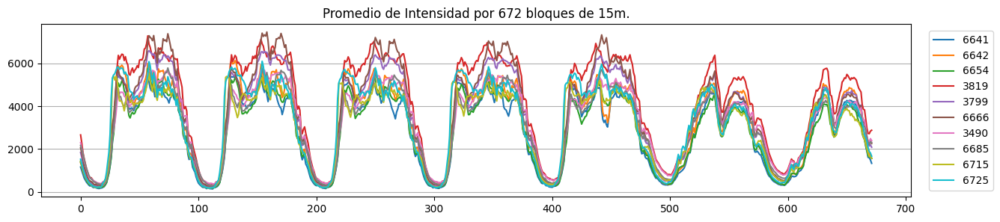

In [67]:
listatemporalIDs = []
for f in range(len(m[fmax])):
    if m[fmax][f] < 100:
        print(m[fmax][f])
        listatemporalIDs.append(list_IDs_final[f])
idfmax = list_IDs_final[fmax]
print(idfmax)
codfmax = dicc_IdCod[idfmax]
print(codfmax)
graficaPromedioBloquesPorSerie(listatemporalIDs, len(listatemporalIDs), 672)

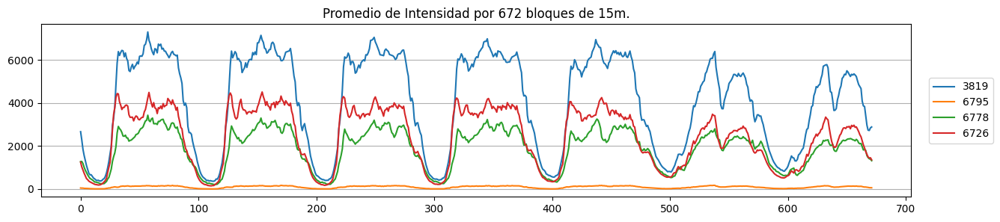

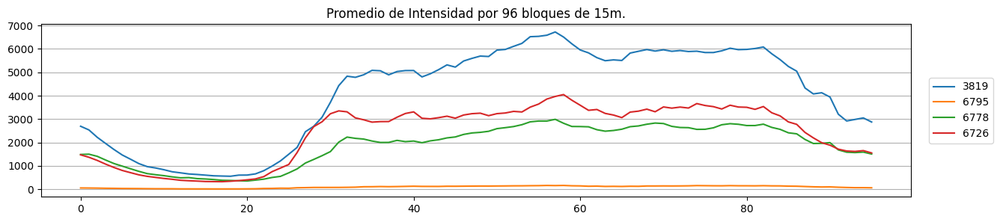

In [68]:
graficaPromedioBloquesPorSerie([3819,6795,6778,6726], 4, 672)
graficaPromedioBloquesPorSerie([3819,6795,6778,6726], 4, 96)

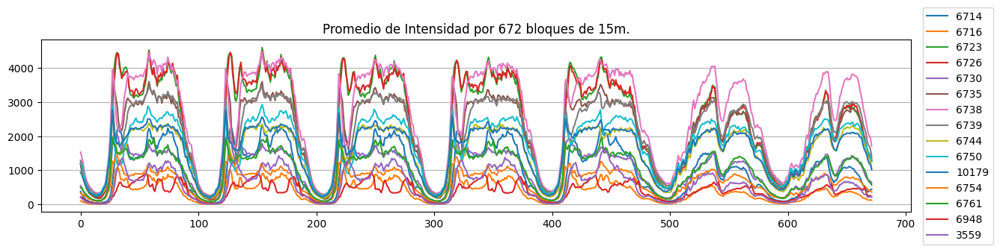

6714 PM20042
6716 PM20152
6723 PM20322
6726 PM20412
6730 PM20472


In [69]:
graficaPromedioBloquesPorSerie(ids_PM_LE[:15], 15, 672)
for i in ids_PM_LE[:5]:
    print(i, dicc_IdCod[i])

In [70]:
def graficaPromedioBloquesPorSerieEnGrande(listaIDs, numSeriesGrafica, numBloquesGrafica):
    if len(listaIDs) < numSeriesGrafica:
        numSeriesGrafica = len(listaIDs)
    promedio_horas = []
    for ids in listaIDs[:numSeriesGrafica]:
        ph = np.zeros(numBloquesGrafica)
        ps = dicc_posID[ids]
        for p in range(numFechas):
            ph[p%numBloquesGrafica] += grillaIntensidad[ps][p]
        muestrasXhora = numFechas/numBloquesGrafica
        for p in range(numBloquesGrafica):
            ph[p] = ph[p] / muestrasXhora
        promedio_horas.append(ph)
    plt.figure(figsize=(16,7))
    for s in range(numSeriesGrafica):
        plt.plot(promedio_horas[s], label=str(listaIDs[s])+" ["+dicc_IdCod[listaIDs[s]]+"]")
    plt.title('Promedio de Intensidad por '+str(numBloquesGrafica)+' bloques de 15m.')
    #plt.savefig('histograma_2024_vecinos_x_distancia.png', bbox_inches='tight')
    plt.grid(axis='y')
    #plt.yscale('log')
    ticks = range(numBloquesGrafica)
    #plt.xticks(ticks)
    plt.legend(loc='center right', bbox_to_anchor=(1.15, 0.5))
    plt.show()
    plt.close()

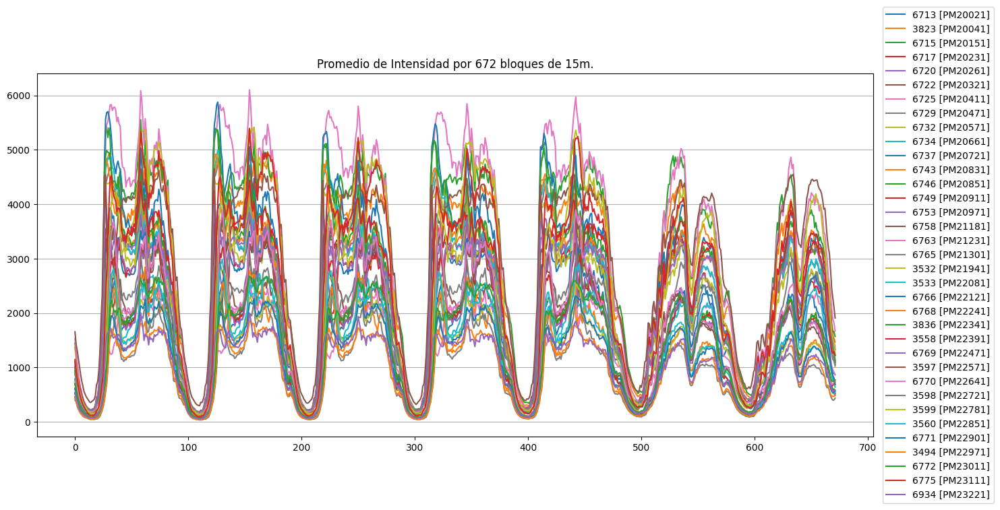

In [71]:
graficaPromedioBloquesPorSerieEnGrande(ids_PM_TE, 100, 672)

In [72]:
# Estrategia: utilizar una serie de referencia y un factor que permita reducir los valores
def estrategiaSerieReferenciaYFactor(listaIDs, listaReferencia):
    if len(listaReferencia) != numFechas:
        print("Error! la lista de referencia no es del largo " + str(numFechas))
    diccHistoDO = {}
    diccHistoPR = {}
    factores = []
    for i in listaIDs:
        ps = dicc_posID[i]
        factor = int(sum(grillaIntensidad[ps]) / sum(listaReferencia))
        factores.append(factor)
        for x in range(numFechas):
            vDO = grillaIntensidad[ps][x]
            if vDO not in diccHistoDO:
                diccHistoDO[vDO] = 1
            else:
                diccHistoDO[vDO] += 1
            vPR = vDO - (factor * listaReferencia[x])
            if vPR not in diccHistoPR:
                diccHistoPR[vPR] = 1
            else:
                diccHistoPR[vPR] += 1
    listadoDicc = [diccHistoDO, diccHistoPR]
    listadoTitu = ["Datos Originales", "Propuesta Prom + Factor"]
    tit = "Histograma Comparación para Datos Originales vs Promedio + Factor (Intensidad)"
    plotHistograma(listadoDicc, listadoTitu, tit)
    print("Factores:", factores)

Valores minimos: [np.int64(0), np.int64(-9720)]
Valores máximos: [np.int64(8452), np.int64(7993)]


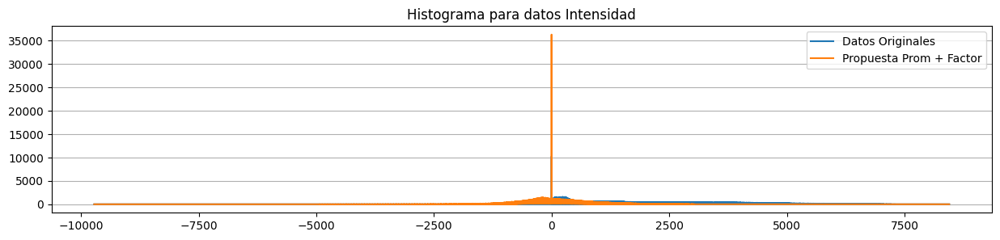

Factores: [12, 14, 10, 9, 12, 12, 10, 15, 16, 12, 10, 9, 14, 10, 12, 14, 7, 11, 8, 7, 4, 7, 3, 4, 4, 5, 3, 1]
Valores minimos: [np.int64(0), np.int64(-17528)]
Valores máximos: [np.int64(8105), np.int64(7788)]


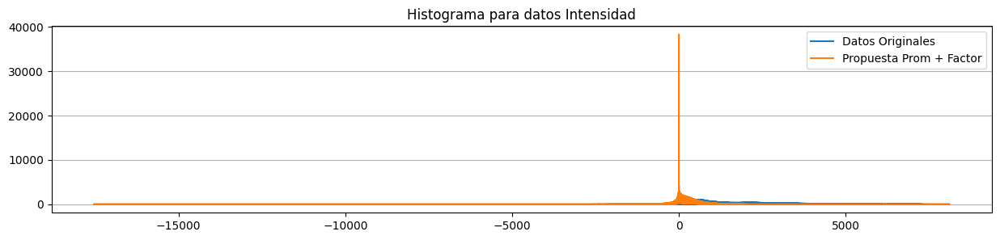

Factores: [1, 4, 7, 7, 7, 7, 9, 14, 5, 7, 11, 7, 5, 1, 2, 1, 1, 3, 5, 2, 1, 4, 1]
Valores minimos: [np.int64(0), np.int64(-9117)]
Valores máximos: [np.int64(7135), np.int64(6016)]


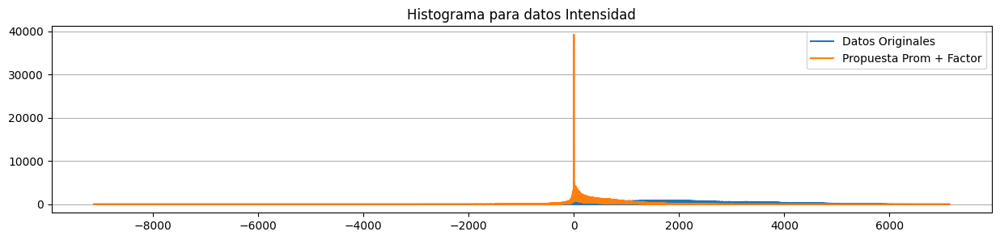

Factores: [2, 3, 3, 2, 2, 1, 3, 2, 2, 2, 2, 2, 2, 2, 2, 3, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1]
Valores minimos: [np.int64(0), np.int64(-7560)]
Valores máximos: [np.int64(5123), np.int64(4407)]


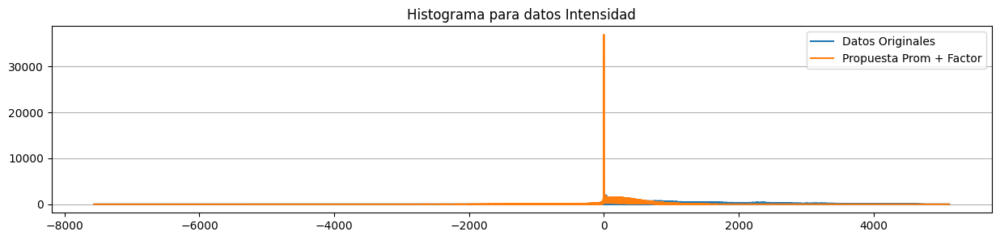

Factores: [2, 1, 6, 6, 2, 5, 6, 5, 4, 4, 4, 1, 2, 1, 1, 3, 1, 1]
Valores minimos: [np.int64(0), np.int64(-5940)]
Valores máximos: [np.int64(6904), np.int64(5844)]


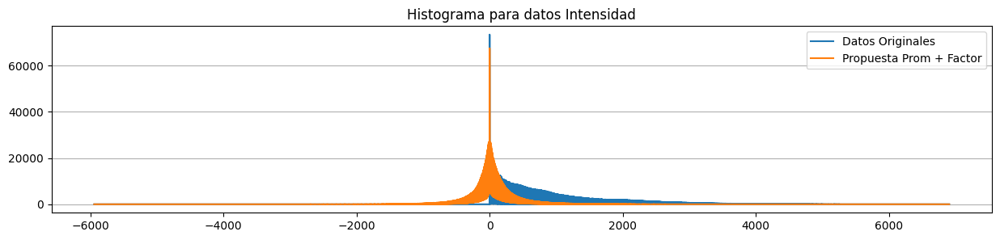

Factores: [12, 4, 2, 6, 9, 8, 5, 4, 9, 6, 5, 14, 6, 11, 1, 4, 17, 15, 17, 11, 2, 1, 1, 5, 16, 10, 8, 6, 8, 7, 6, 4, 6, 5, 7, 3, 9, 13, 5, 14, 6, 6, 7, 3, 12, 1, 27, 2, 26, 7, 17, 4, 11, 3, 14, 7, 5, 12, 5, 12, 19, 27, 16, 20, 17, 3, 16, 1, 16, 4, 7, 27, 3, 11, 3, 7, 15, 2, 6, 19, 3, 3, 5, 7, 27, 5, 5, 8, 4, 1, 11, 5, 9, 2, 16, 15, 14, 2, 9, 22, 8, 3, 9, 3, 12, 17, 22, 15, 8, 18, 5, 17, 1, 3, 16, 14, 3, 14, 4, 6, 6, 16, 4, 6, 10, 7, 10, 6, 11, 4, 12, 14, 1, 15, 5, 5]


In [73]:
# Usando como referencia la lista con la menor suma de valores
for listaIDs in ids_PM_full:
    idMenor = listaIDs[0]
    ps = dicc_posID[idMenor]
    sumMenor = sum(grillaIntensidad[ps])
    for ide in listaIDs:
        ps = dicc_posID[ide]
        s = sum(grillaIntensidad[ps])
        if s < sumMenor :
            sumMenor = s
            idMenor = ide
    ps = dicc_posID[idMenor]
    estrategiaSerieReferenciaYFactor(listaIDs, grillaIntensidad[ps])

0.004163157 189 190 10176 6661


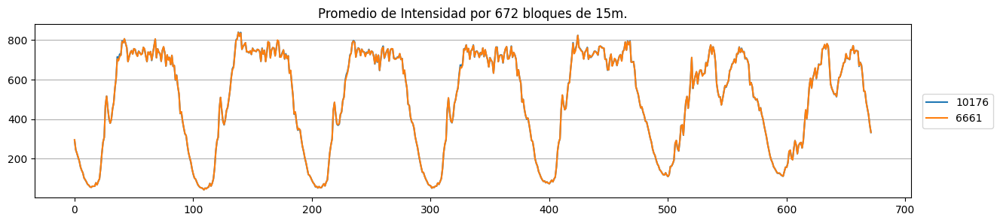

[0.         0.00416316 0.53897426 0.7094057  0.77606263 0.84757877]
Primeros 10
Buscando: 0.0
Encontrado en pos: 189 correspondiente a ID: 10176 con código: PM40462
Buscando: 0.004163157
Encontrado en pos: 190 correspondiente a ID: 6661 con código: PM40463
Buscando: 0.538974263
Encontrado en pos: 103 correspondiente a ID: 10267 con código: PM20778
Buscando: 0.709405705
Encontrado en pos: 114 correspondiente a ID: 10178 con código: PM20948
Buscando: 0.776062627
Encontrado en pos: 155 correspondiente a ID: 6819 con código: PM30472
Buscando: 0.847578767
Encontrado en pos: 160 correspondiente a ID: 3838 con código: PM30902
Buscando: 0.932173282
Encontrado en pos: 192 correspondiente a ID: 7131 con código: PM40752
Buscando: 0.954929206
Encontrado en pos: 25 correspondiente a ID: 3489 con código: PM10728
Buscando: 0.964177975
Encontrado en pos: 45 correspondiente a ID: 6681 con código: PM11102
Buscando: 1.009962043
Encontrado en pos: 162 correspondiente a ID: 6777 con código: PM31264
10176	6

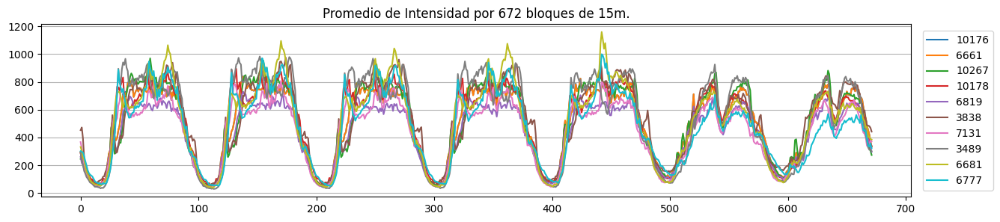

Ultimos 10
Buscando: 625.443125211
Encontrado en pos: 18 correspondiente a ID: 3819 con código: PM10502
Buscando: 520.239234892
Encontrado en pos: 23 correspondiente a ID: 6666 con código: PM10711
Buscando: 455.746400121
Encontrado en pos: 21 correspondiente a ID: 3799 con código: PM10611
Buscando: 444.301889209
Encontrado en pos: 43 correspondiente a ID: 6679 con código: PM11071
Buscando: 387.643479638
Encontrado en pos: 86 correspondiente a ID: 6725 con código: PM20411
Buscando: 377.275515187
Encontrado en pos: 2 correspondiente a ID: 6642 con código: PM10091
Buscando: 365.050081083
Encontrado en pos: 30 correspondiente a ID: 3490 con código: PM10832
Buscando: 329.773700665
Encontrado en pos: 49 correspondiente a ID: 6685 con código: PM11201
Buscando: 313.753949406
Encontrado en pos: 79 correspondiente a ID: 6715 con código: PM20151
Buscando: 285.332236519
Encontrado en pos: 13 correspondiente a ID: 6654 con código: PM10401
3819	6666	3799	6679	6725	6642	3490	6685	6715	6654	


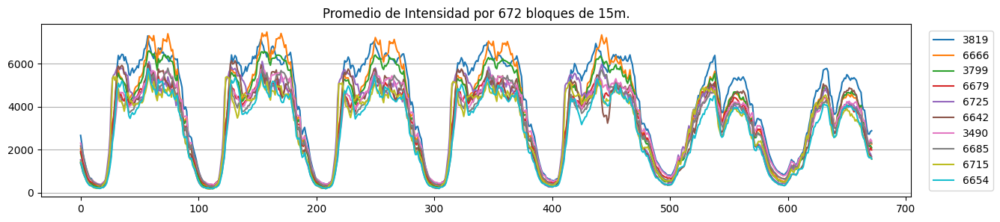

In [74]:
minmatriz = m[0][1]
fmin = [0]
cmin = [1]
for f in range(len(m)):
    for c in range(len(m[f])):
        if m[f][c] < minmatriz and m[f][c] != 0:
            minmatriz = m[f][c]
            fmin = f
            cmin = c
print(minmatriz, fmin, cmin, list_IDs_final[fmin], list_IDs_final[cmin])
graficaPromedioBloquesPorSerie([list_IDs_final[fmin], list_IDs_final[cmin]], 2, 672)
filaMenor = m[fmin].copy()
filaMenor.sort()
print(filaMenor[:6])
print("Primeros 10")
listaIDsMasParecidos = []
for i in range(10):
    busca = filaMenor[i]
    print("Buscando:", busca)
    j = 0
    while j<len(m) and m[fmin][j] != busca:
        j+= 1
    print("Encontrado en pos:", j, "correspondiente a ID:", list_IDs_final[j], "con código:", dicc_IdCod[list_IDs_final[j]])
    listaIDsMasParecidos.append(int(list_IDs_final[j]))
for i in listaIDsMasParecidos:
    print(i, end="\t")
print("")
graficaPromedioBloquesPorSerie(listaIDsMasParecidos, len(listaIDsMasParecidos), 672)
print("Ultimos 10")
listaIDsMasParecidos = []
for i in range(10):
    busca = filaMenor[len(list_IDs_final) - i - 1]
    print("Buscando:", busca)
    j = 0
    while j<len(m) and m[fmin][j] != busca:
        j+= 1
    print("Encontrado en pos:", j, "correspondiente a ID:", list_IDs_final[j], "con código:", dicc_IdCod[list_IDs_final[j]])
    listaIDsMasParecidos.append(int(list_IDs_final[j]))
for i in listaIDsMasParecidos:
    print(i, end="\t")
print("")
graficaPromedioBloquesPorSerie(listaIDsMasParecidos, len(listaIDsMasParecidos), 672)


In [75]:
# Calculando listas de vecindad por distancia
from geopy import distance

In [86]:
# Versión: vecinos por distancia menor a umbral
dist0050 = []
dist0100 = []
dist0150 = []
dist0250 = []
dist0500 = []
dist0750 = []
dist1000 = []
print("Calculando vecinos con distintas distancias")
matrizDistanciasKm = np.zeros((cantSensFinal,cantSensFinal))
for x in range(0,cantSensFinal):
    idx = list_IDs_final[x]
    cooX = (dicc_IdLatLon[idx][0][0], dicc_IdLatLon[idx][0][1])
    temDist0050 = 0
    temDist0100 = 0
    temDist0150 = 0
    temDist0250 = 0
    temDist0500 = 0
    temDist0750 = 0
    temDist1000 = 0
    for y in range(0,cantSensFinal):
        if x != y:
            idy = list_IDs_final[y]
            cooY = (dicc_IdLatLon[idy][0][0], dicc_IdLatLon[idy][0][1])
            dKm = distance.distance(cooX, cooY).km
            matrizDistanciasKm[x][y] = dKm
            if dKm <= 1 :
                temDist1000 += 1
            if dKm <= 0.75:
                temDist0750 += 1
            if dKm <= 0.5:
                temDist0500 += 1
            if dKm <= 0.25:
                temDist0250 += 1
            if dKm <= 0.15:
                temDist0150 += 1
            if dKm <= 0.1:
                temDist0100 += 1
            if dKm <= 0.05:
                temDist0050 += 1
        else:
            matrizDistanciasKm[x][y] = 0.0
    dist0050.append(temDist0050)
    dist0100.append(temDist0100)
    dist0150.append(temDist0150)
    dist0250.append(temDist0250)
    dist0500.append(temDist0500)
    dist0750.append(temDist0750)
    dist1000.append(temDist1000)
print("Listo")

Calculando vecinos con distintas distancias
Listo


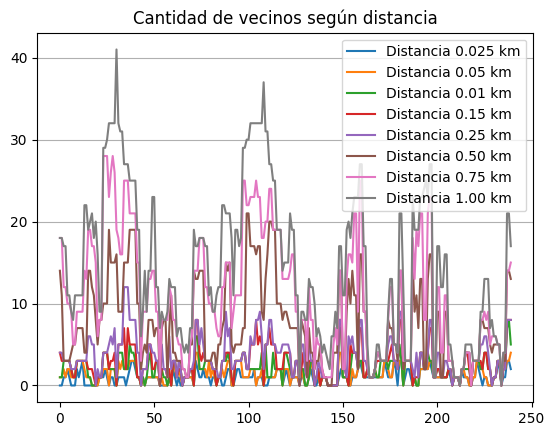

In [87]:
plt.plot(dist0050, label='Distancia 0.05 km')
plt.plot(dist0100, label='Distancia 0.01 km')
plt.plot(dist0150, label='Distancia 0.15 km')
plt.plot(dist0250, label='Distancia 0.25 km')
plt.plot(dist0500, label='Distancia 0.50 km')
plt.plot(dist0750, label='Distancia 0.75 km')
plt.plot(dist1000, label='Distancia 1.00 km')
plt.title("Cantidad de vecinos según distancia")
#plt.savefig('images/histograma_vecinos_x_distncia.png', bbox_inches='tight')
plt.grid(axis='y')
#plt.yscale('log')
plt.legend()
plt.show()
plt.close()

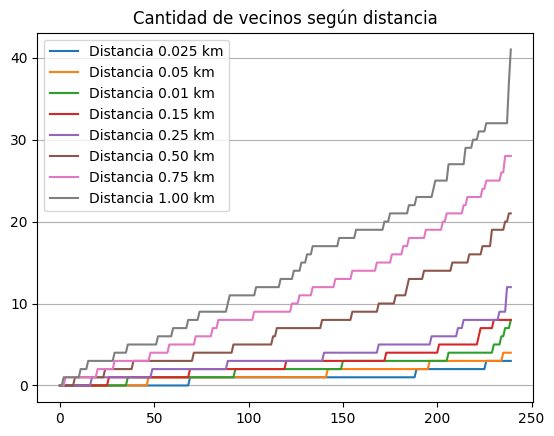

In [89]:
dist0050.sort()
dist0100.sort()
dist0150.sort()
dist0250.sort()
dist0500.sort()
dist0750.sort()
dist1000.sort()
plt.plot(dist0050, label='Distancia 0.05 km')
plt.plot(dist0100, label='Distancia 0.01 km')
plt.plot(dist0150, label='Distancia 0.15 km')
plt.plot(dist0250, label='Distancia 0.25 km')
plt.plot(dist0500, label='Distancia 0.50 km')
plt.plot(dist0750, label='Distancia 0.75 km')
plt.plot(dist1000, label='Distancia 1.00 km')
plt.title("Cantidad de vecinos según distancia")
#plt.savefig('images/histograma_vecinos_x_distncia.png', bbox_inches='tight')
plt.grid(axis='y')
#plt.yscale('log')
plt.legend()
plt.show()
plt.close()

In [92]:
print(matrizDistanciasKm)
print("Generando diccionario con vecinos de 50, 100, 150 y 250 metros.")
dicc_vec_dist_0050 = {}
dicc_vec_dist_0100 = {}
dicc_vec_dist_0150 = {}
dicc_vec_dist_0250 = {}
for x in range(0,cantSensFinal):
    temVec0050 = []
    temVec0100 = []
    temVec0150 = []
    temVec0250 = []
    for y in range(0,cantSensFinal):
        if x != y:
            if matrizDistanciasKm[x][y] <= 0.05:
                temVec0050.append(list_IDs_final[y])
            if matrizDistanciasKm[x][y] <= 0.1:
                temVec0100.append(list_IDs_final[y])
            if matrizDistanciasKm[x][y] <= 0.15:
                temVec0150.append(list_IDs_final[y])
            if matrizDistanciasKm[x][y] <= 0.25:
                temVec0250.append(list_IDs_final[y])
    if len(temVec0050) > 0:
        dicc_vec_dist_0050[list_IDs_final[x]] = temVec0050
    if len(temVec0100) > 0:
        dicc_vec_dist_0100[list_IDs_final[x]] = temVec0100
    if len(temVec0150) > 0:
        dicc_vec_dist_0150[list_IDs_final[x]] = temVec0150
    if len(temVec0250) > 0:
        dicc_vec_dist_0250[list_IDs_final[x]] = temVec0250

# Comprobando coincidencia en el largo de la lista de vecinos
for i in range(5):
    tempID = list_IDs_final[i]
    print("Elemento", i, "con id:", tempID)
    print("050m:", dist0050[i], len(dicc_vec_dist_0050[tempID]), dicc_vec_dist_0050[tempID])
    print("100m:", dist0100[i], len(dicc_vec_dist_0100[tempID]), dicc_vec_dist_0100[tempID])
    print("150m:", dist0150[i], len(dicc_vec_dist_0150[tempID]), dicc_vec_dist_0150[tempID])
    print("250m:", dist0250[i], len(dicc_vec_dist_0250[tempID]), dicc_vec_dist_0250[tempID])

[[0.         0.03509579 0.55316363 ... 0.38901137 0.39507263 0.48652983]
 [0.03509579 0.         0.51866324 ... 0.41843075 0.4246481  0.51684383]
 [0.55316363 0.51866324 0.         ... 0.92189073 0.92861506 1.02226484]
 ...
 [0.38901137 0.41843075 0.92189073 ... 0.         0.00698894 0.10039282]
 [0.39507263 0.4246481  0.92861506 ... 0.00698894 0.         0.0936498 ]
 [0.48652983 0.51684383 1.02226484 ... 0.10039282 0.0936498  0.        ]]
Generando diccionario con vecinos de 50, 100, 150 y 250 metros.
Elemento 0 con id: 6640
050m: 0 1 [np.int64(6641)]
100m: 0 1 [np.int64(6641)]
150m: 0 4 [np.int64(6641), np.int64(6713), np.int64(3821), np.int64(3822)]
250m: 0 4 [np.int64(6641), np.int64(6713), np.int64(3821), np.int64(3822)]
Elemento 1 con id: 6641
050m: 0 1 [np.int64(6640)]
100m: 0 1 [np.int64(6640)]
150m: 0 3 [np.int64(6640), np.int64(6713), np.int64(3822)]
250m: 0 4 [np.int64(6640), np.int64(6713), np.int64(3821), np.int64(3822)]
Elemento 2 con id: 6642
050m: 0 2 [np.int64(6643), n

In [93]:
print(len(dicc_vec_dist_0050))
print(len(dicc_vec_dist_0100))
print(len(dicc_vec_dist_0150))
print(len(dicc_vec_dist_0250))

193
204
214
223


In [84]:
exportarArchivoVecinos(dicc_vec_dist_0050, "outputdata_m30_fulldates/m30_2024_listavecinos_050m_intensidad.txt")
exportarArchivoVecinos(dicc_vec_dist_0100, "outputdata_m30_fulldates/m30_2024_listavecinos_100m_intensidad.txt")
exportarArchivoVecinos(dicc_vec_dist_0150, "outputdata_m30_fulldates/m30_2024_listavecinos_150m_intensidad.txt")
exportarArchivoVecinos(dicc_vec_dist_0250, "outputdata_m30_fulldates/m30_2024_listavecinos_250m_intensidad.txt")

Archivo outputdata_m30_fulldates/m30_2024_listavecinos_050m_intensidad.txt escrito correctamente.
Archivo outputdata_m30_fulldates/m30_2024_listavecinos_100m_intensidad.txt escrito correctamente.
Archivo outputdata_m30_fulldates/m30_2024_listavecinos_150m_intensidad.txt escrito correctamente.
Archivo outputdata_m30_fulldates/m30_2024_listavecinos_250m_intensidad.txt escrito correctamente.


In [95]:
# Generando lista de vecinos donde cada sensor se relaciona con los 2 más cercanos a él.
dicc2vecinosmasproximos = {}
for x in range(cantSensFinal):
    idX = list_IDs_final[x]
    dosmascerca = []
    for y in range(cantSensFinal):
        dxy = matrizDistanciasKm[x][y]
        if dxy > 0:
            if len(dosmascerca) < 2:
                dosmascerca.append(dxy)
            else:
                if dxy < max(dosmascerca):
                    dosmascerca = [min(dosmascerca),dxy]
    idsvecinostemp = []
    for y in range(cantSensFinal):
        if matrizDistanciasKm[x][y] == dosmascerca[0] or matrizDistanciasKm[x][y] == dosmascerca[1]:
            idsvecinostemp.append(int(list_IDs_final[y]))
    dicc2vecinosmasproximos[idX] = idsvecinostemp
    if len(idsvecinostemp) > 2:
        print("Warning! lista con", len(idsvecinostemp), "elementos.")
print("Sensores con los 2 vecinos más cerca:", len(dicc2vecinosmasproximos))
exportarArchivoVecinos(dicc2vecinosmasproximos, "outputdata_m30_fulldates/m30_2024_listavecinos_2masproximos_intensidad.txt")

Sensores con los 2 vecinos más cerca: 240
Archivo outputdata_m30_fulldates/m30_2024_listavecinos_2masproximos_intensidad.txt escrito correctamente.
